# Loading images of training

Found 1991 files.


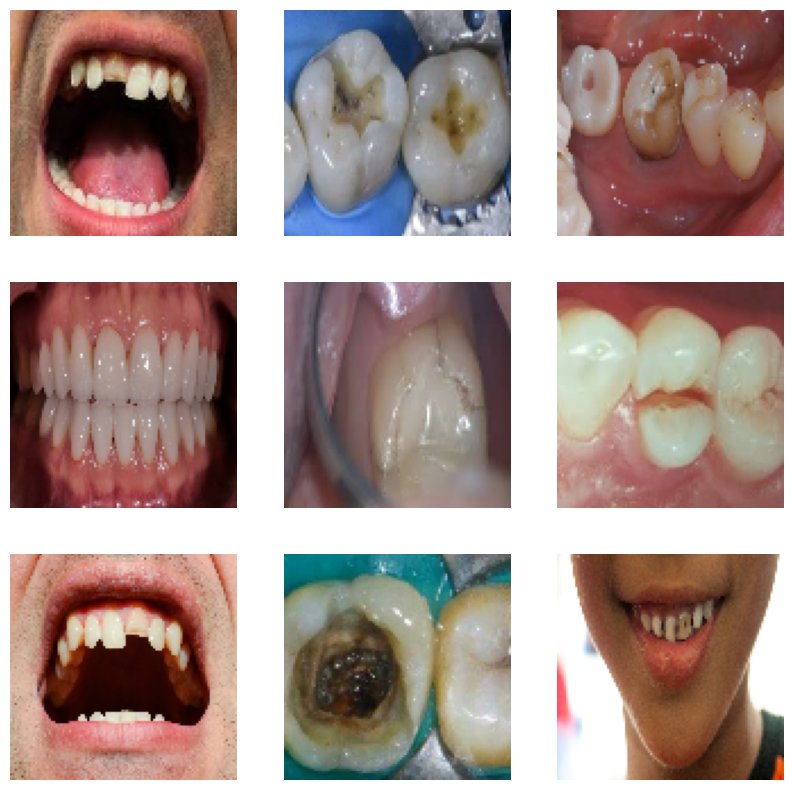

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

# Path to the image directory
img_dir = '/kaggle/input/cariesdetection/dentalai-DatasetNinja/train/img'

# Load the image data
test_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    img_dir,
    image_size=(100,100),  # Resize images to 64x64 pixels
    batch_size=32,  # Number of images to be yielded from the generator per batch
    label_mode=None  # No labels are required for the test set
)

# Display one batch of test images
for images in test_dataset.take(1):
    plt.figure(figsize=(10, 10))
    for i in range(9):
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.axis("off")
    plt.show()


# Loading images of testing

Found 250 files.


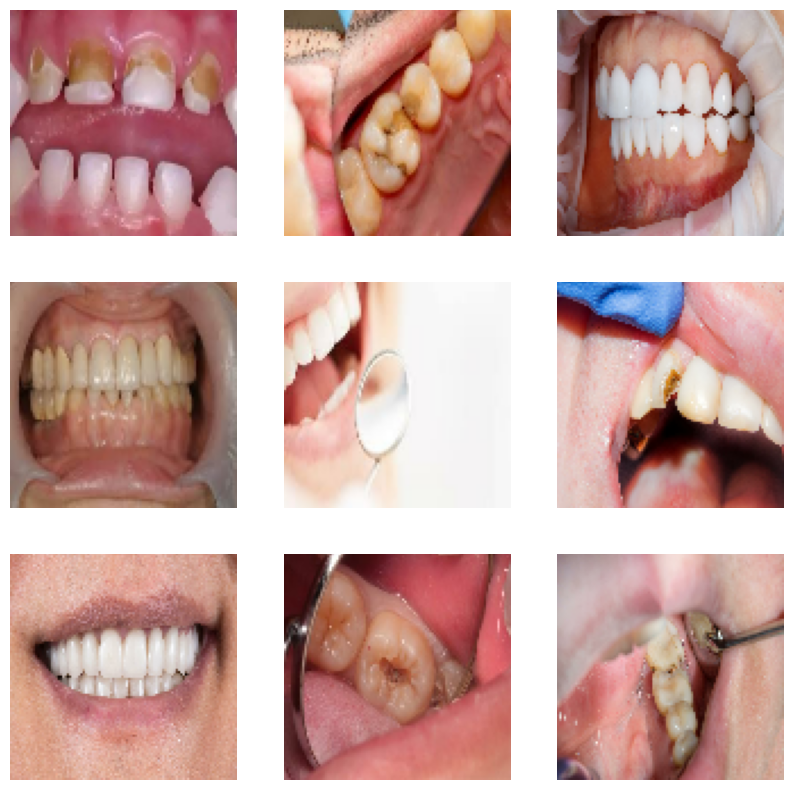

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

# Path to the image directory
img_dir = '/kaggle/input/cariesdetection/dentalai-DatasetNinja/test/img'

# Load the image data
test_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    img_dir,
    image_size=(100,100),  # Resize images to 64x64 pixels
    batch_size=32,  # Number of images to be yielded from the generator per batch
    label_mode=None  # No labels are required for the test set
)

# Display one batch of test images
for images in test_dataset.take(1):
    plt.figure(figsize=(10, 10))
    for i in range(9):
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.axis("off")
    plt.show()


# Loading images of validation

Found 254 files.


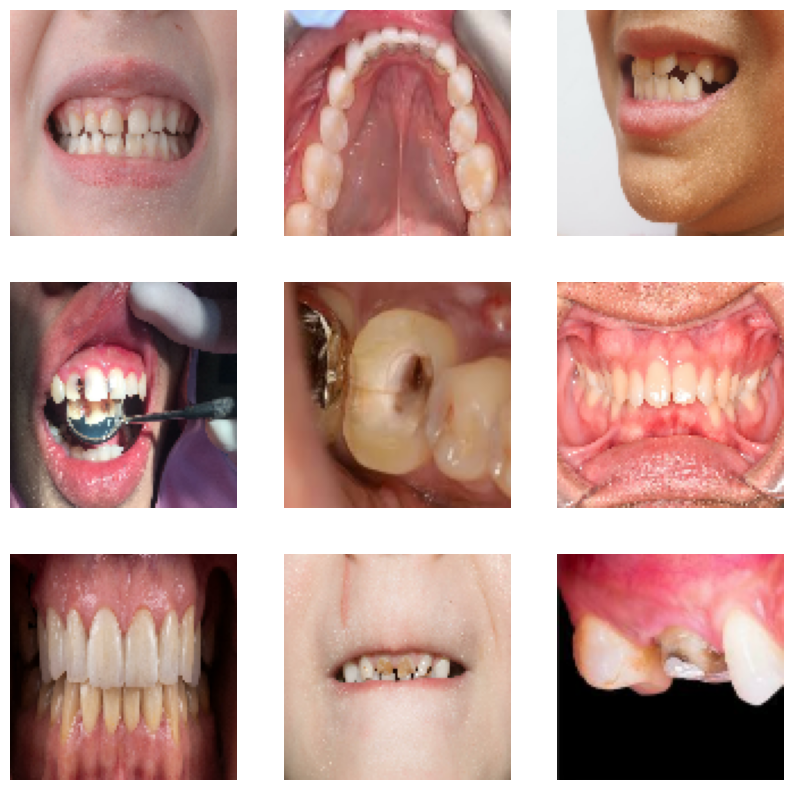

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

# Path to the image directory
img_dir = '/kaggle/input/cariesdetection/dentalai-DatasetNinja/valid/img'

# Load the image data
test_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    img_dir,
    image_size=(100,100),  # Resize images to 64x64 pixels
    batch_size=32,  # Number of images to be yielded from the generator per batch
    label_mode=None  # No labels are required for the test set
)

# Display one batch of test images
for images in test_dataset.take(1):
    plt.figure(figsize=(10, 10))
    for i in range(9):
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.axis("off")
    plt.show()

1. **Normalization of training images**

In [ ]:
import os

train_dir = '/kaggle/input/cariesdetection/dentalai-DatasetNinja/train'

# Paths to subdirectories
img_dir = os.path.join(train_dir, 'img')
ann_dir = os.path.join(train_dir, 'ann')

# Count images
img_count = sum(1 for img_file in os.listdir(img_dir) if os.path.isfile(os.path.join(img_dir, img_file)) and img_file.endswith(('.jpg', '.png')))
print(f"Total number of images: {img_count}")

# Count annotations
ann_count = sum(1 for ann_file in os.listdir(ann_dir) if os.path.isfile(os.path.join(ann_dir, ann_file)) and ann_file.endswith('.json'))
print(f"Total number of annotations: {ann_count}")


Total number of images: 1991
Total number of annotations: 1991


In [ ]:
import os
import json

# Path to the annotations directory
ann_dir = '/kaggle/input/cariesdetection/dentalai-DatasetNinja/train/ann'

# Inspect the structure of a sample annotation file
for ann_file in os.listdir(ann_dir):
    ann_path = os.path.join(ann_dir, ann_file)
    if os.path.isfile(ann_path) and ann_file.endswith('.json'):
        with open(ann_path, 'r') as f:
            annotation_data = json.load(f)
            print(f"Sample data from {ann_file}:", json.dumps(annotation_data, indent=4))
            break  # Print only one file's content for inspection

Sample data from 3068_jpg.rf.1b4e94cb3b5a1d54d584540ab2dfd795.jpg.json: {
    "description": "",
    "tags": [],
    "size": {
        "height": 450,
        "width": 600
    },
    "objects": [
        {
            "id": 44648274,
            "classId": 4668093,
            "description": "",
            "geometryType": "polygon",
            "labelerLogin": "inbox@datasetninja.com",
            "createdAt": "2023-09-15T14:10:18.301Z",
            "updatedAt": "2023-09-15T14:10:18.301Z",
            "tags": [],
            "classTitle": "Cavity",
            "points": {
                "exterior": [
                    [
                        69,
                        196
                    ],
                    [
                        76,
                        196
                    ],
                    [
                        80,
                        201
                    ],
                    [
                        86,
                        206
          

In [ ]:
import os
import json

# Path to the annotations directory
ann_dir = '/kaggle/input/cariesdetection/dentalai-DatasetNinja/train/ann'

# Set to store unique class titles
unique_classes = set()

# Iterate through each annotation file
for ann_file in os.listdir(ann_dir):
    ann_path = os.path.join(ann_dir, ann_file)
    if os.path.isfile(ann_path) and ann_file.endswith('.json'):
        with open(ann_path, 'r') as f:
            annotation_data = json.load(f)

            # Extract class titles from each object
            for obj in annotation_data.get("objects", []):
                class_title = obj.get("classTitle")
                if class_title:
                    unique_classes.add(class_title)

# Output the results
print("Total number of classes:", len(unique_classes))
print("Classes:", unique_classes)


Total number of classes: 4
Classes: {'Cavity', 'Caries', 'Tooth', 'Crack'}


In [ ]:
import os
import json

# Set the path to your 'train' directory
train_dir = '/kaggle/input/cariesdetection/dentalai-DatasetNinja/train'

# List the annotation files (assuming they are all in 'ann' folder)
annotation_folder = os.path.join(train_dir, 'ann')

# Initialize a dictionary to store the count of images per class
class_counts = {
    'Caries': set(),
    'Cavity': set(),
    'Tooth': set(),
    'Crack': set()
}

# Loop through each annotation file and count images per class
for annotation_file in os.listdir(annotation_folder):
    if annotation_file.endswith('.json'):
        with open(os.path.join(annotation_folder, annotation_file), 'r') as f:
            annotation_data = json.load(f)
            image_name = annotation_file.split('.')[0]  # Extract image name from the file name

            # Check each object in the annotation and add the image to the appropriate class set
            for obj in annotation_data.get('objects', []):
                class_label = obj.get('classTitle')
                if class_label in class_counts:
                    class_counts[class_label].add(image_name)  # Add image name to class set

# Output the count of unique images per class
for class_name, images in class_counts.items():
    print(f"Class '{class_name}' has {len(images)} unique images.")


Class 'Caries' has 964 unique images.
Class 'Cavity' has 817 unique images.
Class 'Tooth' has 1989 unique images.
Class 'Crack' has 131 unique images.


In [ ]:
import os
import json

# Set the path to your 'train' directory
train_dir = '/kaggle/input/cariesdetection/dentalai-DatasetNinja/train'

# List the annotation files
ann_dir = os.path.join(train_dir, 'ann')
annotation_files = os.listdir(ann_dir)

# Initialize a dictionary to store the count of unique images per class
class_counts = { 'Cavity': 0, 'Caries': 0, 'Tooth': 0, 'Crack': 0 }

# Iterate over annotation files
for ann_file in annotation_files:
    # Load the annotation file
    with open(os.path.join(ann_dir, ann_file), 'r') as f:
        annotation = json.load(f)

    # Track unique image occurrence for each class
    for obj in annotation['objects']:
        class_label = obj['classTitle']
        if class_label in class_counts:
            class_counts[class_label] += 1

# Print the results
for class_name, count in class_counts.items():
    print(f"Class '{class_name}' appears {count} times in the annotations.")


Class 'Cavity' appears 1452 times in the annotations.
Class 'Caries' appears 3451 times in the annotations.
Class 'Tooth' appears 17884 times in the annotations.
Class 'Crack' appears 150 times in the annotations.


In [ ]:
import os
import json

# Set the path to your 'train' directory
train_dir = '/kaggle/input/cariesdetection/dentalai-DatasetNinja/train'

# List the annotation files
ann_dir = os.path.join(train_dir, 'ann')
annotation_files = os.listdir(ann_dir)

# Initialize a variable to store the total count of class occurrences
total_class_count = 0

# Iterate over annotation files
for ann_file in annotation_files:
    # Load the annotation file
    with open(os.path.join(ann_dir, ann_file), 'r') as f:
        annotation = json.load(f)

    # Count the number of classes in the current annotation
    for obj in annotation['objects']:
        total_class_count += 1  # Each object corresponds to one class occurrence

# Print the total number of class occurrences
print(f"Total number of class occurrences (across all classes) is: {total_class_count}")


Total number of class occurrences (across all classes) is: 22937


In [ ]:
import os

# Set paths to your directories
annotations_dir = '/kaggle/input/cariesdetection/dentalai-DatasetNinja/train/ann'
images_dir = '/kaggle/input/cariesdetection/dentalai-DatasetNinja/train/img'

# Function to get unique extensions in a directory
def list_unique_extensions(directory):
    extensions = set()
    for filename in os.listdir(directory):
        ext = os.path.splitext(filename)[1]  # Extracts the file extension
        extensions.add(ext)
    return extensions

# Get unique extensions in annotations and images directories
annotation_extensions = list_unique_extensions(annotations_dir)
image_extensions = list_unique_extensions(images_dir)

print("Unique annotation file extensions:", annotation_extensions)
print("Unique image file extensions:", image_extensions)


In [ ]:
import os  # Operating system interfaces
import tensorflow as tf                                    # TensorFlow deep learning framework
import matplotlib.pyplot as plt                            # Plotting library
import matplotlib.image as mpimg                           # Image loading and manipulation library
from tensorflow.keras.models import Sequential, Model      # Sequential and Functional API for building models
from tensorflow.keras.optimizers import Adam               # Adam optimizer for model training
from tensorflow.keras.callbacks import EarlyStopping       # Early stopping callback for model training
from tensorflow.keras.regularizers import l1, l2           # L1 and L2 regularization for model regularization
from tensorflow.keras.preprocessing.image import ImageDataGenerator  # Data augmentation and preprocessing for images
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D, AveragePooling2D, MaxPooling2D, BatchNormalization
# Various types of layers for building neural networks
from tensorflow.keras.applications import DenseNet121, EfficientNetB4, Xception, VGG16, VGG19   # Pre-trained models for transfer learning

In [ ]:
train_image_dir = "/kaggle/input/cariesdetection/dentalai-DatasetNinja/train/img"
train_annotation_dir = "/kaggle/input/cariesdetection/dentalai-DatasetNinja/train/ann"

valid_image_dir = "/kaggle/input/cariesdetection/dentalai-DatasetNinja/valid/img"
valid_annotation_dir = "/kaggle/input/cariesdetection/dentalai-DatasetNinja/valid/ann"

test_image_dir = "/kaggle/input/cariesdetection/dentalai-DatasetNinja/test/img"
test_annotation_dir = "/kaggle/input/cariesdetection/dentalai-DatasetNinja/test/ann"

Found 1991 JSON files.
Processing File: 3068_jpg.rf.1b4e94cb3b5a1d54d584540ab2dfd795.jpg.json
{'description': '', 'tags': [], 'size': {'height': 450, 'width': 600}, 'objects': [{'id': 44648274, 'classId': 4668093, 'description': '', 'geometryType': 'polygon', 'labelerLogin': 'inbox@datasetninja.com', 'createdAt': '2023-09-15T14:10:18.301Z', 'updatedAt': '2023-09-15T14:10:18.301Z', 'tags': [], 'classTitle': 'Cavity', 'points': {'exterior': [[69, 196], [76, 196], [80, 201], [86, 206], [92, 209], [98, 213], [102, 217], [108, 222], [114, 225], [120, 229], [124, 233], [132, 237], [137, 241], [142, 245], [146, 250], [149, 257], [150, 262], [152, 269], [154, 275], [158, 281], [163, 287], [168, 292], [174, 295], [180, 294], [185, 294], [192, 294], [198, 298], [201, 304], [202, 310], [203, 316], [200, 321], [195, 324], [188, 325], [182, 325], [176, 327], [170, 327], [163, 327], [157, 325], [151, 322], [145, 319], [140, 316], [133, 313], [121, 310], [112, 307], [106, 305], [100, 303], [95, 299],

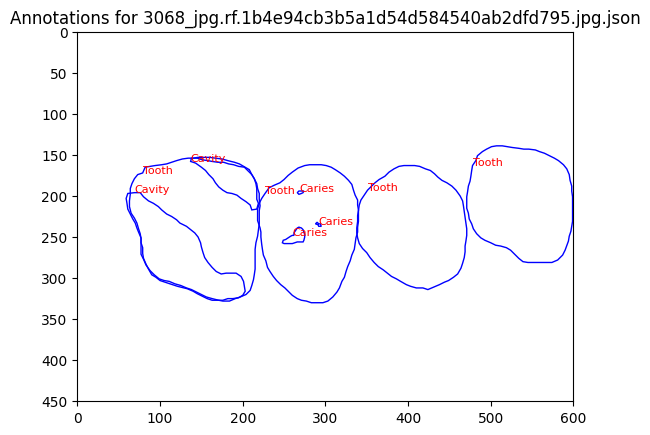

Processing File: 2539_jpg.rf.9b39bf87199b2789e0f1d061f3a8c95d.jpg.json
{'description': '', 'tags': [], 'size': {'height': 138, 'width': 209}, 'objects': [{'id': 44661101, 'classId': 4668095, 'description': '', 'geometryType': 'polygon', 'labelerLogin': 'inbox@datasetninja.com', 'createdAt': '2023-09-15T14:11:05.014Z', 'updatedAt': '2023-09-15T14:11:05.014Z', 'tags': [], 'classTitle': 'Tooth', 'points': {'exterior': [[0, 24], [9, 28], [15, 33], [24, 43], [28, 50], [27, 66], [25, 72], [21, 75], [10, 67], [3, 61], [0, 59], [0, 30]], 'interior': []}}, {'id': 44661100, 'classId': 4668093, 'description': '', 'geometryType': 'polygon', 'labelerLogin': 'inbox@datasetninja.com', 'createdAt': '2023-09-15T14:11:05.013Z', 'updatedAt': '2023-09-15T14:11:05.013Z', 'tags': [], 'classTitle': 'Cavity', 'points': {'exterior': [[100, 62], [103, 78], [103, 91], [106, 102], [112, 105], [120, 109], [136, 108], [148, 102], [158, 100], [165, 93], [168, 82], [171, 73], [170, 65], [167, 60], [159, 58], [153, 55

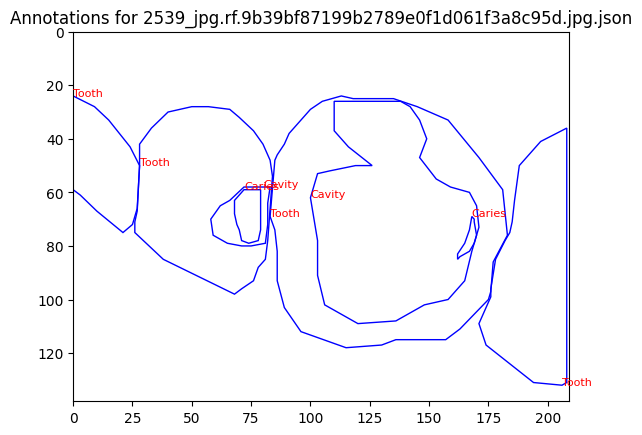

Processing File: 641_jpg.rf.51f469ab2eb4fb805442861b45b4f665.jpg.json
{'description': '', 'tags': [], 'size': {'height': 437, 'width': 512}, 'objects': [{'id': 44655527, 'classId': 4668095, 'description': '', 'geometryType': 'polygon', 'labelerLogin': 'inbox@datasetninja.com', 'createdAt': '2023-09-15T14:10:47.558Z', 'updatedAt': '2023-09-15T14:10:47.558Z', 'tags': [], 'classTitle': 'Tooth', 'points': {'exterior': [[295, 156], [286, 151], [267, 152], [261, 154], [250, 150], [235, 147], [223, 148], [211, 150], [196, 156], [184, 162], [178, 167], [169, 170], [160, 174], [151, 177], [134, 184], [125, 193], [116, 202], [107, 213], [99, 227], [97, 241], [101, 254], [113, 272], [117, 288], [125, 311], [132, 332], [147, 341], [163, 352], [178, 357], [194, 363], [208, 363], [223, 360], [233, 356], [241, 349], [258, 336], [273, 324], [286, 317], [304, 303], [316, 291], [333, 280], [333, 271], [327, 253], [318, 241], [315, 236], [312, 220], [309, 210], [305, 203], [301, 199], [296, 193], [293, 1

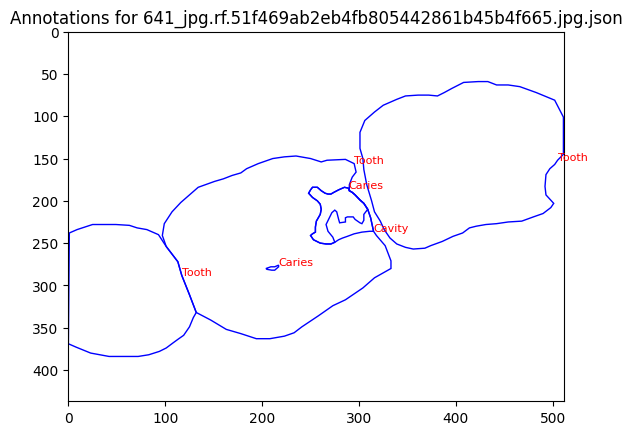

Processing File: 699_jpg.rf.d6fe473d47116ac23ee8f215d6f80e69.jpg.json
{'description': '', 'tags': [], 'size': {'height': 1791, 'width': 3270}, 'objects': [{'id': 44634721, 'classId': 4668095, 'description': '', 'geometryType': 'polygon', 'labelerLogin': 'inbox@datasetninja.com', 'createdAt': '2023-09-15T14:09:29.604Z', 'updatedAt': '2023-09-15T14:09:29.604Z', 'tags': [], 'classTitle': 'Tooth', 'points': {'exterior': [[684, 888], [672, 896], [664, 909], [645, 939], [630, 962], [616, 980], [604, 1000], [594, 1019], [585, 1036], [576, 1056], [569, 1075], [560, 1096], [553, 1121], [547, 1145], [541, 1164], [533, 1215], [534, 1241], [540, 1261], [542, 1285], [547, 1305], [548, 1323], [566, 1340], [580, 1349], [595, 1356], [616, 1359], [631, 1359], [649, 1359], [684, 1314], [705, 1295], [720, 1279], [736, 1255], [743, 1243], [753, 1230], [772, 1197], [781, 1168], [795, 1110], [798, 1073], [799, 1059], [803, 1026], [804, 1010], [804, 994], [801, 980], [794, 963], [766, 939], [748, 923], [737,

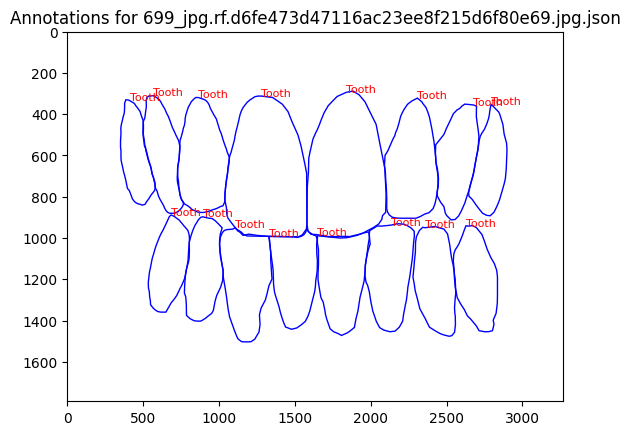

Processing File: 274_jpg.rf.ded2d93c4834786c74d9a0382c08f019.jpg.json
{'description': '', 'tags': [], 'size': {'height': 1960, 'width': 4032}, 'objects': [{'id': 44635307, 'classId': 4668095, 'description': '', 'geometryType': 'polygon', 'labelerLogin': 'inbox@datasetninja.com', 'createdAt': '2023-09-15T14:09:32.434Z', 'updatedAt': '2023-09-15T14:09:32.434Z', 'tags': [], 'classTitle': 'Tooth', 'points': {'exterior': [[1631, 1233], [1637, 1256], [1631, 1293], [1632, 1351], [1638, 1404], [1648, 1466], [1662, 1506], [1681, 1530], [1719, 1556], [1765, 1581], [1824, 1591], [1865, 1596], [1912, 1592], [1969, 1590], [2017, 1570], [2069, 1558], [2099, 1537], [2113, 1511], [2123, 1440], [2126, 1385], [2134, 1356], [2126, 1278], [2117, 1212], [2106, 1172], [2080, 1157], [2031, 1143], [1966, 1134], [1894, 1129], [1835, 1130], [1786, 1146], [1747, 1161], [1712, 1177], [1681, 1196], [1652, 1213]], 'interior': []}}, {'id': 44635306, 'classId': 4668093, 'description': '', 'geometryType': 'polygon', '

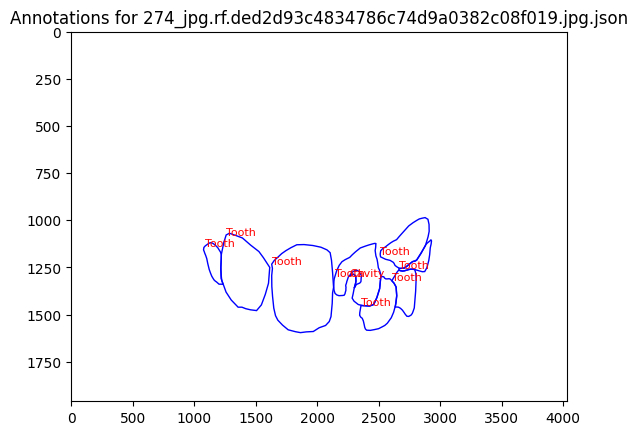

Processing File: 2007_jpg.rf.edc983a8e60efc95e52c9dd9053055ab.jpg.json
{'description': '', 'tags': [], 'size': {'height': 720, 'width': 1280}, 'objects': [{'id': 44638008, 'classId': 4668093, 'description': '', 'geometryType': 'polygon', 'labelerLogin': 'inbox@datasetninja.com', 'createdAt': '2023-09-15T14:09:39.150Z', 'updatedAt': '2023-09-15T14:09:39.150Z', 'tags': [], 'classTitle': 'Cavity', 'points': {'exterior': [[509, 196], [466, 253], [444, 318], [436, 373], [429, 412], [451, 444], [495, 467], [533, 481], [591, 489], [625, 496], [662, 516], [705, 520], [735, 506], [771, 474], [779, 427], [780, 384], [767, 312], [758, 269], [729, 233], [681, 247], [647, 253], [611, 240], [579, 205], [555, 180], [531, 180]], 'interior': []}}, {'id': 44638007, 'classId': 4668095, 'description': '', 'geometryType': 'polygon', 'labelerLogin': 'inbox@datasetninja.com', 'createdAt': '2023-09-15T14:09:39.149Z', 'updatedAt': '2023-09-15T14:09:39.149Z', 'tags': [], 'classTitle': 'Tooth', 'points': {'exter

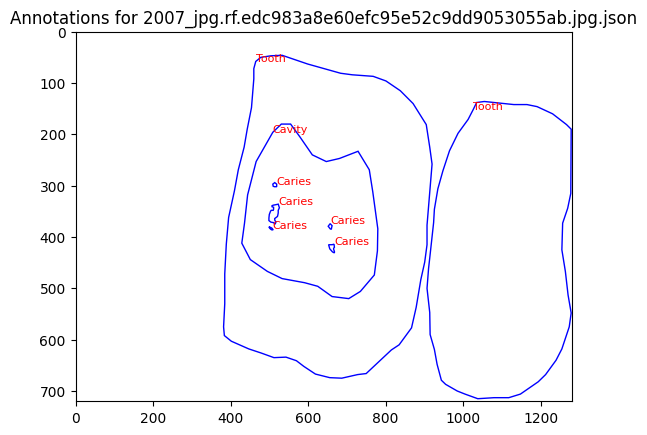

Processing File: 1785_jpg.rf.adf4280e80e7f0f18f6869b696144266.jpg.json
{'description': '', 'tags': [], 'size': {'height': 2054, 'width': 3013}, 'objects': [{'id': 44663038, 'classId': 4668095, 'description': '', 'geometryType': 'polygon', 'labelerLogin': 'inbox@datasetninja.com', 'createdAt': '2023-09-15T14:11:15.274Z', 'updatedAt': '2023-09-15T14:11:15.274Z', 'tags': [], 'classTitle': 'Tooth', 'points': {'exterior': [[619, 686], [616, 717], [616, 759], [619, 807], [628, 852], [635, 893], [644, 937], [659, 968], [681, 1012], [702, 1046], [718, 1068], [742, 1091], [769, 1096], [802, 1089], [840, 1070], [851, 1060], [869, 1046], [881, 1031], [881, 1011], [876, 985], [875, 956], [873, 922], [870, 898], [871, 870], [873, 844], [873, 821], [855, 806], [815, 778], [790, 755], [741, 719], [712, 683], [686, 664], [660, 659], [632, 664], [623, 673]], 'interior': []}}, {'id': 44663037, 'classId': 4668095, 'description': '', 'geometryType': 'polygon', 'labelerLogin': 'inbox@datasetninja.com', 'cr

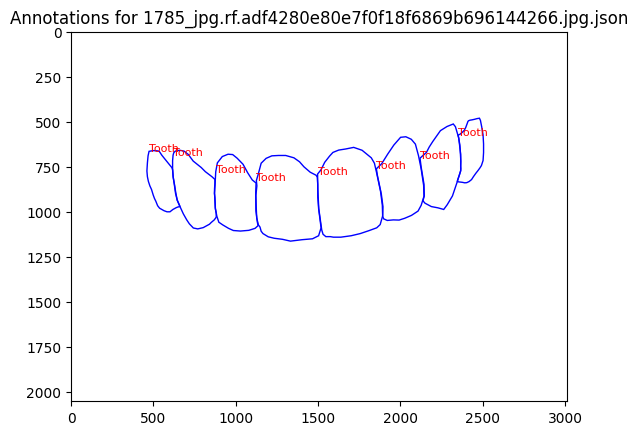

Processing File: 389_jpg.rf.7552c53b03124407b86644309a432d8a.jpg.json
{'description': '', 'tags': [], 'size': {'height': 4050, 'width': 6545}, 'objects': [{'id': 44642754, 'classId': 4668095, 'description': '', 'geometryType': 'polygon', 'labelerLogin': 'inbox@datasetninja.com', 'createdAt': '2023-09-15T14:10:00.751Z', 'updatedAt': '2023-09-15T14:10:00.751Z', 'tags': [], 'classTitle': 'Tooth', 'points': {'exterior': [[5451, 1575], [5386, 1568], [5338, 1563], [5296, 1575], [5253, 1595], [5198, 1633], [5159, 1657], [5139, 1695], [5146, 1745], [5158, 1848], [5164, 1905], [5166, 1942], [5156, 2037], [5141, 2088], [5183, 2115], [5231, 2157], [5283, 2189], [5323, 2209], [5353, 2229], [5369, 2244], [5401, 2257], [5431, 2262], [5458, 2262], [5493, 2255], [5525, 2245], [5558, 2222], [5580, 2202], [5605, 2175], [5630, 2144], [5650, 2115], [5660, 2095], [5678, 2070], [5675, 2018], [5673, 1918], [5673, 1873], [5671, 1822], [5663, 1757], [5650, 1682], [5638, 1643], [5631, 1602]], 'interior': []}}, 

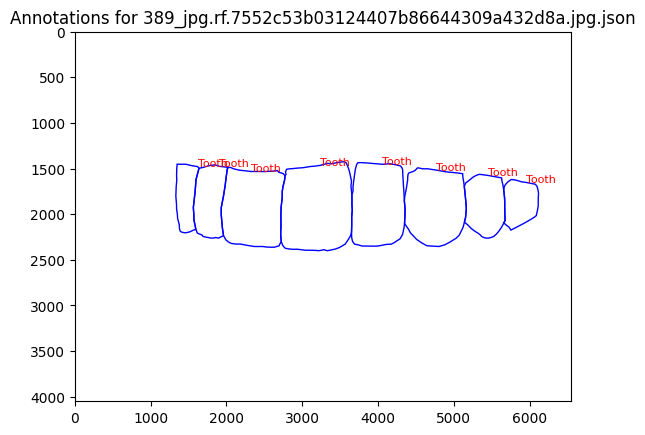

Processing File: 1793_jpg.rf.752db2eb6fbc8fdda72f259453ca5f6d.jpg.json
{'description': '', 'tags': [], 'size': {'height': 1873, 'width': 2475}, 'objects': [{'id': 44642513, 'classId': 4668094, 'description': '', 'geometryType': 'polygon', 'labelerLogin': 'inbox@datasetninja.com', 'createdAt': '2023-09-15T14:10:00.728Z', 'updatedAt': '2023-09-15T14:10:00.728Z', 'tags': [], 'classTitle': 'Crack', 'points': {'exterior': [[835, 949], [855, 958], [856, 980], [851, 1022], [867, 1056], [885, 1084], [900, 1094], [928, 1094], [954, 1091], [977, 1086], [1003, 1082], [1044, 1084], [1085, 1077], [1117, 1074], [1150, 1067], [1183, 1066], [1228, 1067], [1279, 1059], [1309, 1053], [1347, 1056], [1373, 1064], [1420, 1070], [1458, 1070], [1483, 1069], [1510, 1076], [1566, 1060], [1568, 1031], [1557, 1024], [1557, 1019], [1557, 999], [1541, 1000], [1542, 970], [1535, 957], [1519, 948], [1509, 968], [1508, 954], [1496, 951], [1489, 960], [1483, 939], [1480, 936], [1468, 939], [1445, 945], [1429, 932], [1

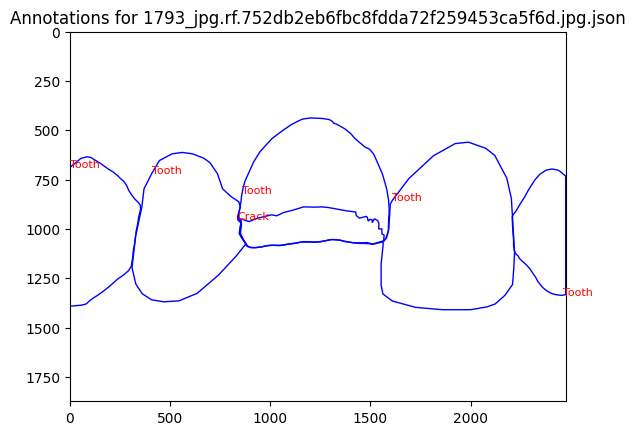

Processing File: 3415_jpg.rf.1f5171c2e23f430fe317138d30fabf6b.jpg.json
{'description': '', 'tags': [], 'size': {'height': 419, 'width': 340}, 'objects': [{'id': 44648437, 'classId': 4668093, 'description': '', 'geometryType': 'polygon', 'labelerLogin': 'inbox@datasetninja.com', 'createdAt': '2023-09-15T14:10:18.314Z', 'updatedAt': '2023-09-15T14:10:18.314Z', 'tags': [], 'classTitle': 'Cavity', 'points': {'exterior': [[127, 134], [108, 154], [100, 176], [95, 199], [96, 232], [93, 250], [102, 259], [100, 278], [107, 293], [119, 302], [139, 307], [156, 306], [164, 301], [170, 283], [172, 270], [174, 247], [183, 229], [202, 214], [219, 198], [227, 183], [243, 167], [258, 153], [262, 143], [252, 128], [236, 120], [218, 112], [198, 112], [170, 115], [145, 123]], 'interior': []}}, {'id': 44648436, 'classId': 4668092, 'description': '', 'geometryType': 'polygon', 'labelerLogin': 'inbox@datasetninja.com', 'createdAt': '2023-09-15T14:10:18.314Z', 'updatedAt': '2023-09-15T14:10:18.314Z', 'tags': 

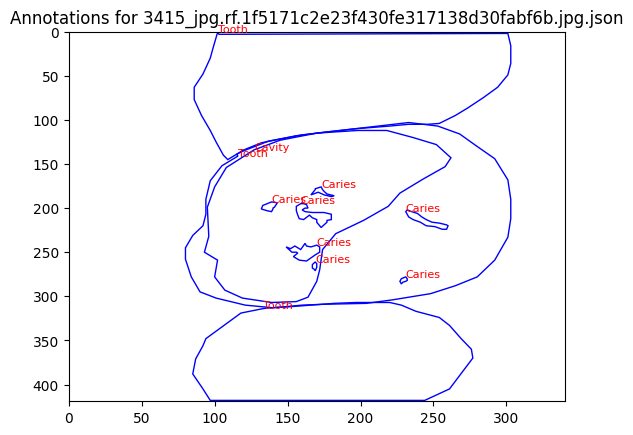

Processing File: 2031_jpg.rf.f62e7de000956cd9532406ba979ea3b0.jpg.json
{'description': '', 'tags': [], 'size': {'height': 159, 'width': 318}, 'objects': [{'id': 44638436, 'classId': 4668095, 'description': '', 'geometryType': 'polygon', 'labelerLogin': 'inbox@datasetninja.com', 'createdAt': '2023-09-15T14:09:42.047Z', 'updatedAt': '2023-09-15T14:09:42.047Z', 'tags': [], 'classTitle': 'Tooth', 'points': {'exterior': [[61, 29], [59, 37], [57, 41], [60, 47], [62, 52], [67, 56], [72, 57], [77, 55], [80, 53], [83, 48], [83, 43], [82, 38], [81, 35], [79, 33], [73, 31], [67, 30]], 'interior': []}}, {'id': 44638435, 'classId': 4668095, 'description': '', 'geometryType': 'polygon', 'labelerLogin': 'inbox@datasetninja.com', 'createdAt': '2023-09-15T14:09:42.047Z', 'updatedAt': '2023-09-15T14:09:42.047Z', 'tags': [], 'classTitle': 'Tooth', 'points': {'exterior': [[168, 45], [163, 47], [160, 51], [159, 55], [158, 59], [158, 63], [158, 68], [159, 70], [163, 71], [169, 68], [172, 57], [172, 54], [17

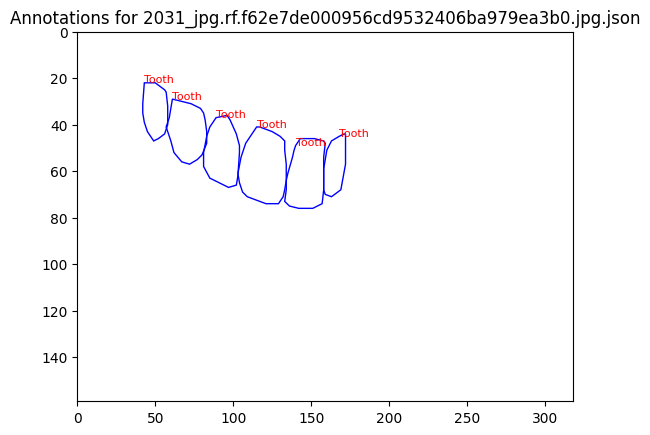

Processing File: 109_jpg.rf.9028d7ed339240d9769cfde3f2ac5546.jpg.json
{'description': '', 'tags': [], 'size': {'height': 3648, 'width': 5472}, 'objects': [{'id': 44659417, 'classId': 4668095, 'description': '', 'geometryType': 'polygon', 'labelerLogin': 'inbox@datasetninja.com', 'createdAt': '2023-09-15T14:11:01.222Z', 'updatedAt': '2023-09-15T14:11:01.222Z', 'tags': [], 'classTitle': 'Tooth', 'points': {'exterior': [[4108, 1646], [4139, 1616], [4183, 1574], [4224, 1541], [4260, 1519], [4299, 1517], [4328, 1552], [4350, 1597], [4363, 1656], [4379, 1712], [4384, 1772], [4384, 1833], [4360, 1894], [4332, 1940], [4317, 1972], [4295, 1997], [4273, 1998], [4246, 1990], [4180, 1978], [4175, 1967], [4150, 1948], [4134, 1941], [4120, 1935], [4139, 1907], [4138, 1799], [4108, 1689], [4101, 1655]], 'interior': []}}, {'id': 44659416, 'classId': 4668095, 'description': '', 'geometryType': 'polygon', 'labelerLogin': 'inbox@datasetninja.com', 'createdAt': '2023-09-15T14:11:01.222Z', 'updatedAt': '20

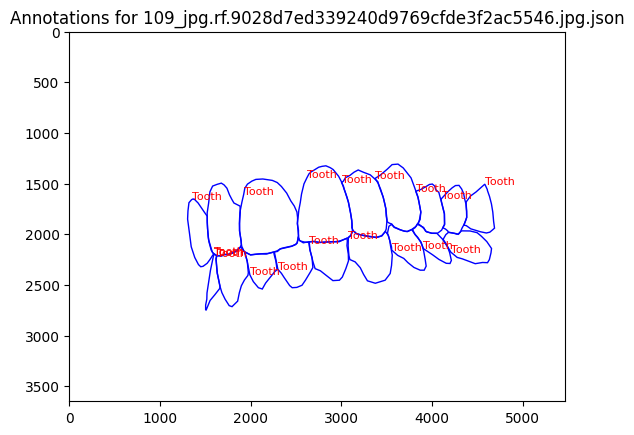

Processing File: 2829_jpg.rf.f10296a35fbced33553509538aa871f3.jpg.json
{'description': '', 'tags': [], 'size': {'height': 183, 'width': 275}, 'objects': [{'id': 44637781, 'classId': 4668092, 'description': '', 'geometryType': 'polygon', 'labelerLogin': 'inbox@datasetninja.com', 'createdAt': '2023-09-15T14:09:39.130Z', 'updatedAt': '2023-09-15T14:09:39.130Z', 'tags': [], 'classTitle': 'Caries', 'points': {'exterior': [[108, 103], [103, 104], [100, 108], [101, 110], [106, 108], [110, 108], [111, 112], [113, 115], [114, 116], [117, 116], [121, 109], [122, 105], [117, 106], [116, 107], [113, 106]], 'interior': []}}, {'id': 44637780, 'classId': 4668095, 'description': '', 'geometryType': 'polygon', 'labelerLogin': 'inbox@datasetninja.com', 'createdAt': '2023-09-15T14:09:39.130Z', 'updatedAt': '2023-09-15T14:09:39.130Z', 'tags': [], 'classTitle': 'Tooth', 'points': {'exterior': [[22, 32], [23, 46], [24, 52], [30, 59], [41, 66], [45, 67], [49, 72], [43, 77], [38, 78], [34, 78], [31, 78], [28,

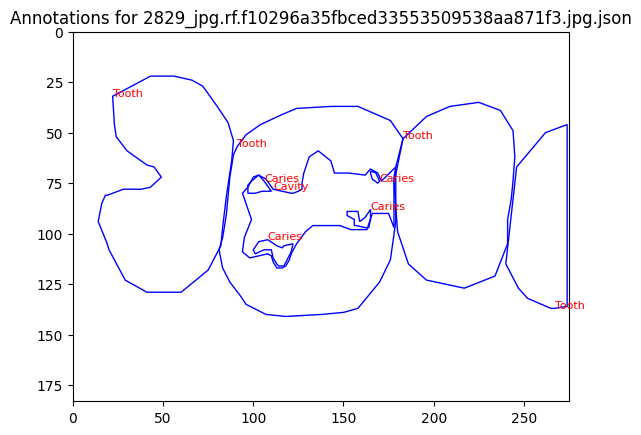

Processing File: 2607_jpg.rf.544ba6c50ac5f69d91fb787b5a7f0a8c.jpg.json
{'description': '', 'tags': [], 'size': {'height': 180, 'width': 281}, 'objects': [{'id': 44656574, 'classId': 4668095, 'description': '', 'geometryType': 'polygon', 'labelerLogin': 'inbox@datasetninja.com', 'createdAt': '2023-09-15T14:10:51.088Z', 'updatedAt': '2023-09-15T14:10:51.088Z', 'tags': [], 'classTitle': 'Tooth', 'points': {'exterior': [[218, 94], [221, 108], [232, 113], [236, 112], [236, 106], [236, 100], [236, 98], [234, 97], [233, 96], [232, 92], [231, 90], [231, 88]], 'interior': []}}, {'id': 44656573, 'classId': 4668095, 'description': '', 'geometryType': 'polygon', 'labelerLogin': 'inbox@datasetninja.com', 'createdAt': '2023-09-15T14:10:51.088Z', 'updatedAt': '2023-09-15T14:10:51.088Z', 'tags': [], 'classTitle': 'Tooth', 'points': {'exterior': [[12, 77], [9, 79], [6, 81], [6, 85], [7, 89], [8, 93], [10, 96], [15, 97], [18, 96], [19, 96], [22, 88], [23, 85], [18, 85], [17, 84], [15, 81], [14, 79], [14

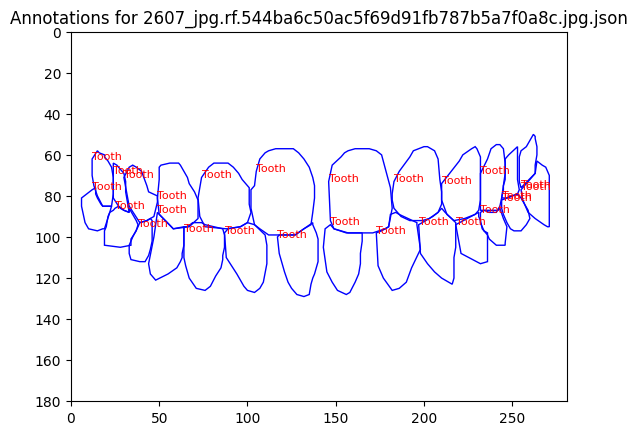

Processing File: 1919_jpg.rf.2936c11d19516209c115fb467eca5068.jpg.json
{'description': '', 'tags': [], 'size': {'height': 200, 'width': 289}, 'objects': [{'id': 44651218, 'classId': 4668095, 'description': '', 'geometryType': 'polygon', 'labelerLogin': 'inbox@datasetninja.com', 'createdAt': '2023-09-15T14:10:26.666Z', 'updatedAt': '2023-09-15T14:10:26.666Z', 'tags': [], 'classTitle': 'Tooth', 'points': {'exterior': [[158, 33], [156, 33], [155, 35], [155, 37], [154, 39], [153, 42], [153, 44], [153, 47], [154, 51], [155, 55], [156, 58], [158, 61], [159, 62], [161, 64], [165, 64], [169, 63], [171, 63], [172, 62], [176, 62], [178, 60], [180, 57], [181, 55], [182, 53], [183, 51], [184, 49], [184, 46], [184, 44], [183, 42], [181, 41], [179, 39], [177, 37], [174, 36], [171, 35], [169, 34], [163, 32], [160, 32]], 'interior': []}}, {'id': 44651217, 'classId': 4668095, 'description': '', 'geometryType': 'polygon', 'labelerLogin': 'inbox@datasetninja.com', 'createdAt': '2023-09-15T14:10:26.666Z',

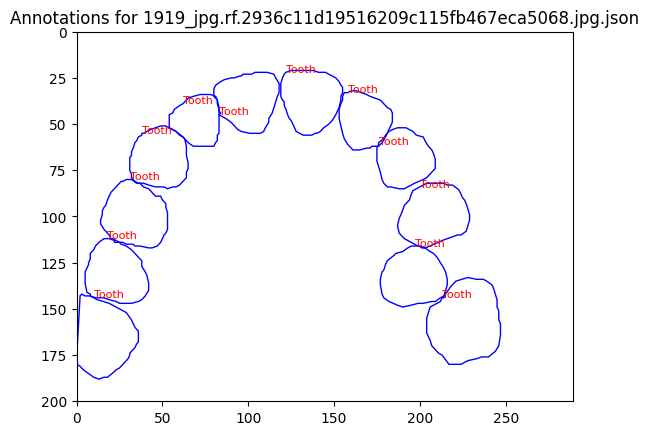

In [ ]:
import os
import json
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon

# Directory containing JSON annotation files
ann_dir = "/kaggle/input/cariesdetection/dentalai-DatasetNinja/train/ann"

# Get all JSON files from the directory
json_files = [f for f in os.listdir(ann_dir) if f.endswith(".json")]

# Debug: Print number of files
print(f"Found {len(json_files)} JSON files.")

# Process and plot the first 5 files
for i, json_file in enumerate(json_files[:15]):  # Limit to 5 files
    file_path = os.path.join(ann_dir, json_file)

    # Load the JSON file
    with open(file_path, "r") as file:
        data = json.load(file)

    # Debug: Print file name and content
    print(f"Processing File: {json_file}")
    print(data)

    # Create a plot for the current file
    fig, ax = plt.subplots()

    # Set axis limits if size info is present
    if "size" in data:
        ax.set_xlim(0, data["size"]["width"])
        ax.set_ylim(0, data["size"]["height"])
        ax.invert_yaxis()  # Optional: Invert Y-axis for image-style coordinates

    # Plot polygons with labels
    for obj in data.get("objects", []):
        exterior = obj["points"]["exterior"]
        label = obj.get("classTitle", "Unknown")  # Get the label/class of the object
        print(f"Label: {label}, Exterior Points: {exterior}")  # Debug

        if exterior:
            # Draw the polygon
            polygon = Polygon(exterior, closed=True, edgecolor='blue', fill=False)
            ax.add_patch(polygon)

            # Add label at the first vertex of the polygon
            x, y = exterior[0]
            ax.text(x, y, label, color="red", fontsize=8)

    # Show the plot
    plt.title(f"Annotations for {json_file}")
    plt.show()


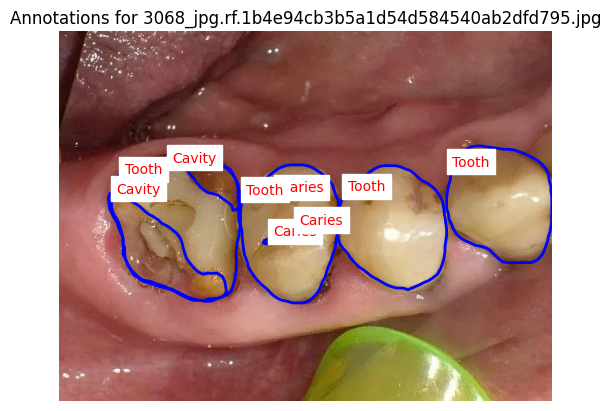

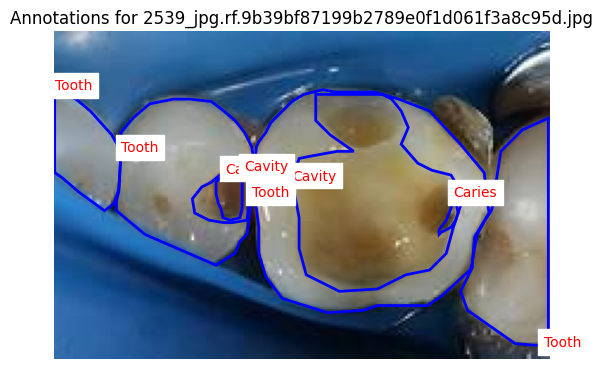

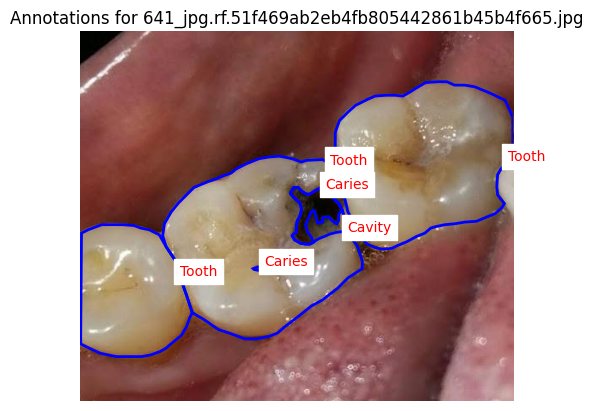

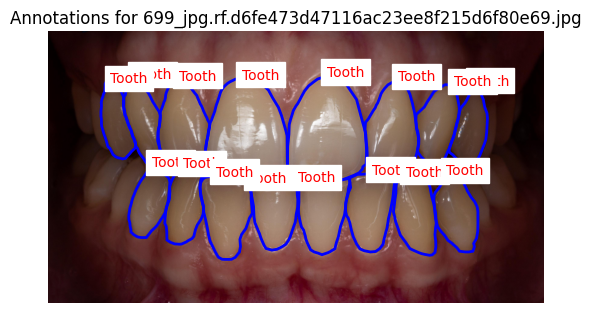

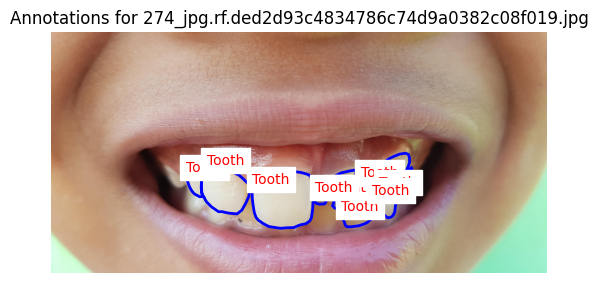

...

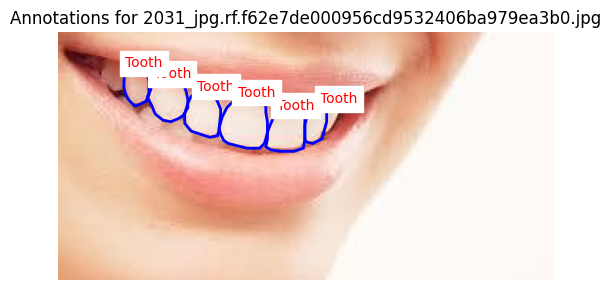

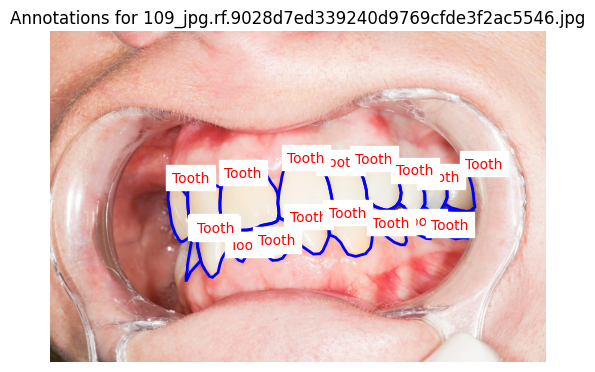

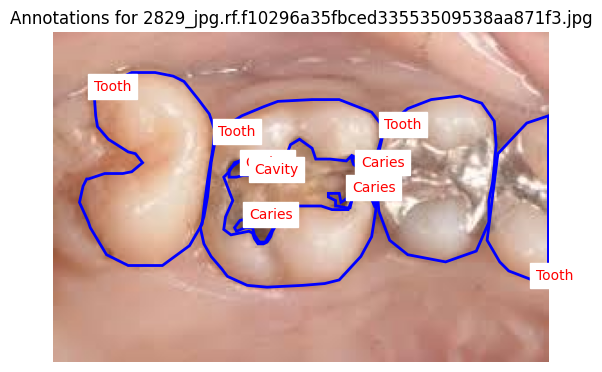

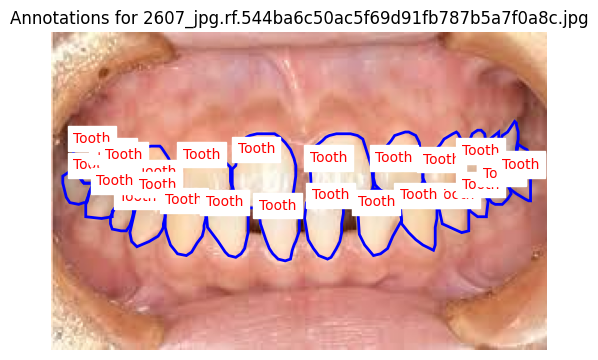

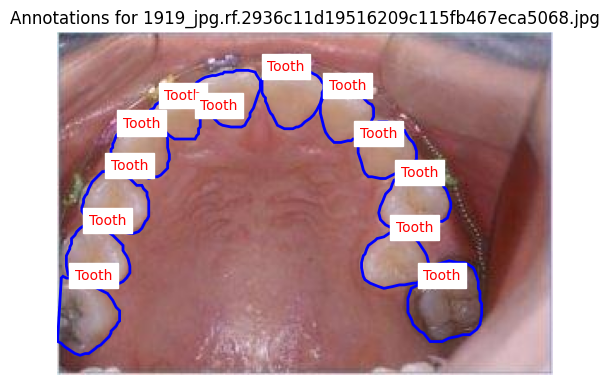

In [ ]:
import os
import json
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
import matplotlib.image as mpimg  # For loading images

# Directories for annotations and images
ann_dir = "/kaggle/input/cariesdetection/dentalai-DatasetNinja/train/ann"
img_dir = "/kaggle/input/cariesdetection/dentalai-DatasetNinja/train/img"

# Get all JSON files from the annotation directory
json_files = [f for f in os.listdir(ann_dir) if f.endswith(".json")]

# Process and plot the first 5 files
for i, json_file in enumerate(json_files[:15]):  # Limit to the first 5 files
    ann_path = os.path.join(ann_dir, json_file)
    img_name = json_file.replace(".json", "")  # Remove only the `.json` suffix
    img_path = os.path.join(img_dir, img_name)

    # Check if the corresponding image exists
    if not os.path.exists(img_path):
        print(f"Image file {img_name} not found for annotation {json_file}. Skipping.")
        continue

    # Load the JSON annotation file
    with open(ann_path, "r") as file:
        data = json.load(file)

    # Load the image
    image = mpimg.imread(img_path)

    # Create a plot for the current file
    fig, ax = plt.subplots()
    ax.imshow(image)  # Display the image

    # Plot polygons with labels
    for obj in data.get("objects", []):
        exterior = obj["points"]["exterior"]
        label = obj.get("classTitle", "Unknown")  # Get the label/class of the object

        if exterior:
            # Draw the polygon
            polygon = Polygon(exterior, closed=True, edgecolor='blue', fill=False, linewidth=2)
            ax.add_patch(polygon)

            # Add label at the first vertex of the polygon
            x, y = exterior[0]
            ax.text(x, y, label, color="red", fontsize=10, backgroundcolor="white")

    # Set plot title and remove axes
    plt.title(f"Annotations for {img_name}")
    plt.axis("off")  # Hide axes for better visualization
    plt.show()


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import json
import numpy as np
import cv2
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.model_selection import train_test_split

# Define directories
base_dir = '/content/drive/MyDrive/ML project/dental'
splits = ["train", "valid", "test"]

# Preprocessing configuration
image_size = (224, 224)  # Resize images to 224x224, adjust if needed

# Function to load data for a given split
def load_and_preprocess_data(base_dir, split, image_size):
    image_dir = os.path.join(base_dir, split, "img")
    annotation_dir = os.path.join(base_dir, split, "ann")

    image_paths = []
    labels = []

    for ann_file in os.listdir(annotation_dir):
        if ann_file.endswith('.json'):
            ann_path = os.path.join(annotation_dir, ann_file)
            with open(ann_path, 'r') as f:
                annotation = json.load(f)

            # Extract classTitles
            objects = annotation.get("objects", [])
            class_titles = [obj["classTitle"] for obj in objects]

            if class_titles:
                image_file = ann_file.replace('.json', '')  # Adjust extension if necessary
                image_path = os.path.join(image_dir, image_file)

                if os.path.exists(image_path):
                    # Load image and resize
                    image = load_img(image_path, target_size=image_size)
                    image = img_to_array(image) / 255.0  # Normalize the image to [0, 1]

                    # Append image and labels
                    image_paths.append(image)
                    labels.append(class_titles)  # Store the list of classes per image

    return np.array(image_paths), labels

# Initialize dictionaries to store data for all splits
all_image_paths = {}
all_labels = {}

# Load data for all splits and preprocess images
for split in splits:
    images, labels = load_and_preprocess_data(base_dir, split, image_size)
    all_image_paths[split] = images
    all_labels[split] = labels

# Combine all labels to create a universal mapping
combined_labels = all_labels["train"] + all_labels["valid"] + all_labels["test"]
unique_labels = sorted(set(label for sublist in combined_labels for label in sublist))  # Flatten and get unique labels
label_to_index = {label: idx for idx, label in enumerate(unique_labels)}

# Convert string labels to multi-hot numerical indices
def multi_hot_encode(labels, label_to_index):
    encoding = np.zeros(len(label_to_index), dtype=int)
    for label in labels:
        encoding[label_to_index[label]] = 1
    return encoding

numerical_labels = {split: [multi_hot_encode(labels_list, label_to_index) for labels_list in all_labels[split]] for split in splits}

# Print summary after preprocessing
for split in splits:
    flattened_labels = [label for label_list in all_labels[split] for label in label_list]
    unique_classes = sorted(set(flattened_labels))
    print(f"{split.capitalize()} set: {all_image_paths[split].shape[0]} images, {len(unique_classes)} unique classes")


Train set: 1991 images, 4 unique classes
Valid set: 254 images, 4 unique classes
Test set: 250 images, 4 unique classes


In [ ]:
print(f"Train set labels: {len(numerical_labels['train'])}")
print(f"Valid set labels: {len(numerical_labels['valid'])}")
print(f"Test set labels: {len(numerical_labels['test'])}")

Train set labels: 1991
Valid set labels: 254
Test set labels: 250


Image File Name: 315_jpg.rf.34e5cdea4f822e0f2d3e7340ae8352d1.jpg, Multi-hot Encoding: [1 1 0 1]


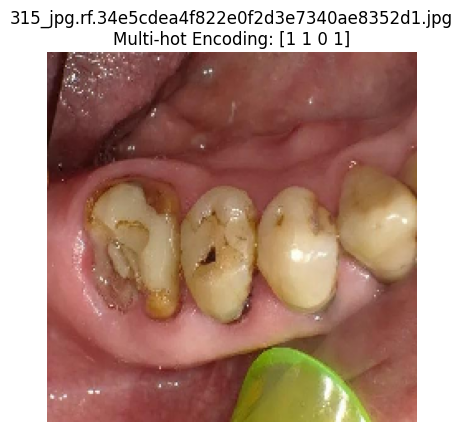

Image File Name: 284_jpg.rf.a8711c939c8d230b022f8722e12223dc.jpg, Multi-hot Encoding: [1 1 0 1]


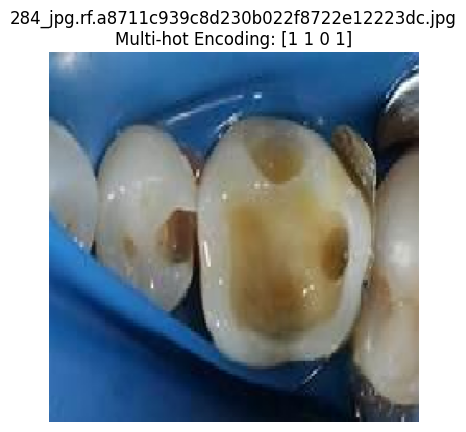

Image File Name: 3089_jpg.rf.4249b9794e4a5a41eb8a6ab37c476c1d.jpg, Multi-hot Encoding: [1 1 0 1]


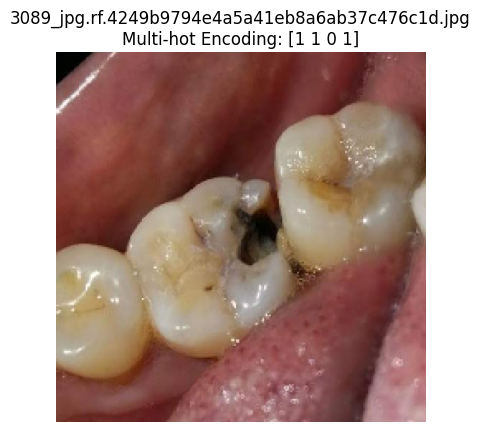

Image File Name: 591_jpg.rf.dc50b5bab5b0fc964a4fa96ea8e9e949.jpg, Multi-hot Encoding: [0 0 0 1]


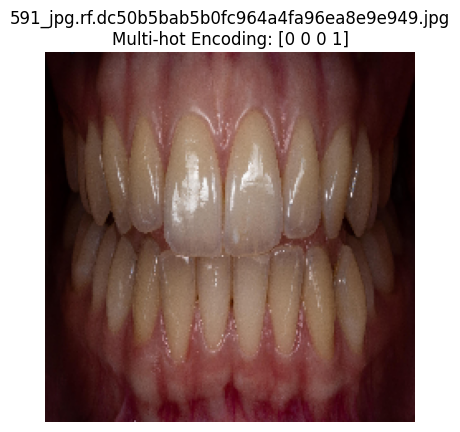

Image File Name: 479_jpg.rf.6c259b01c198e140a6b4bec1ebbf4fff.jpg, Multi-hot Encoding: [0 1 0 1]


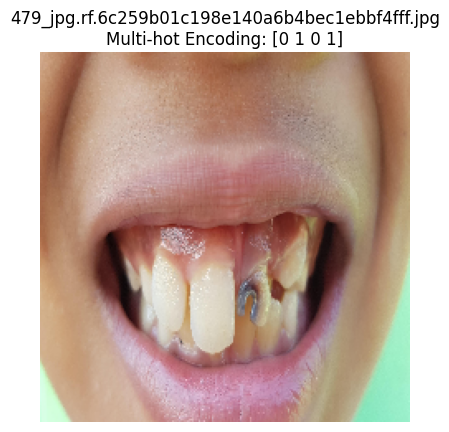

Image File Name: 100_jpg.rf.b82625b276769d80f0c12c1f0b318d6f.jpg, Multi-hot Encoding: [1 1 0 1]


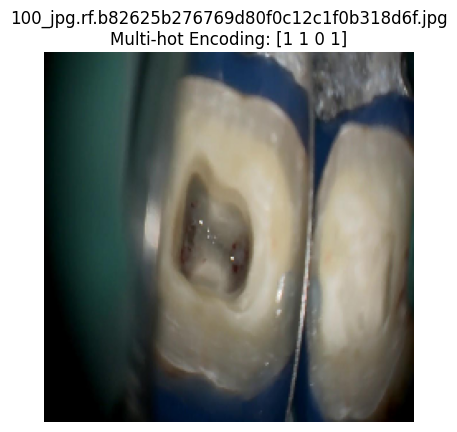

Image File Name: 2270_jpg.rf.a271c7564cb4ddef619a0eafd48996b4.jpg, Multi-hot Encoding: [0 0 0 1]


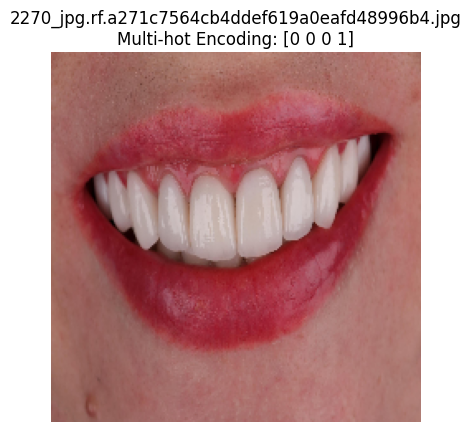

Image File Name: 2205_jpg.rf.f3ecf58f408677a7bfaefea68050cc8b.jpg, Multi-hot Encoding: [0 0 0 1]


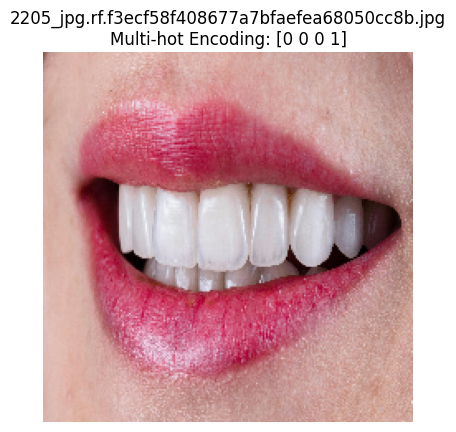

Image File Name: 3254_jpg.rf.2c0564297c7f71ba0553459870ddca7c.jpg, Multi-hot Encoding: [0 0 1 1]


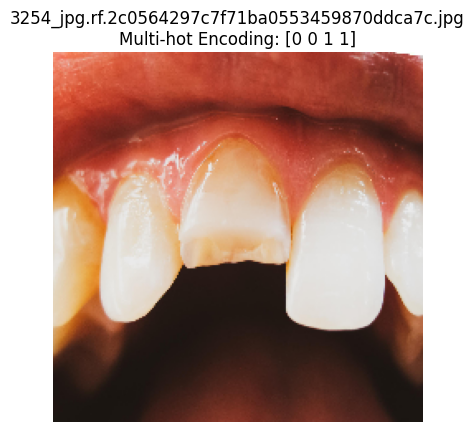

Image File Name: 452_jpg.rf.ac4c034d998c05215576341189af6801.jpg, Multi-hot Encoding: [1 1 0 1]


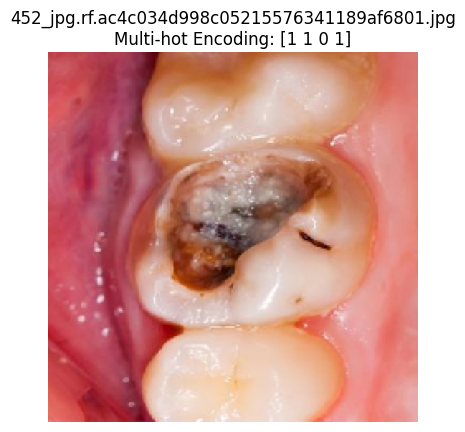

Image File Name: 1533_jpg.rf.514d6699fad33bd09b73342da53064c1.jpg, Multi-hot Encoding: [0 0 0 1]


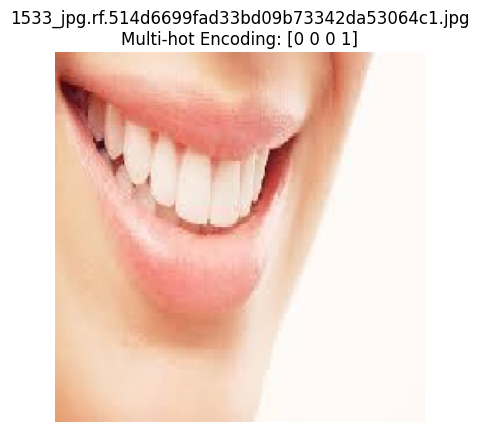

Image File Name: 1568_jpg.rf.a6f3e63fefdaf3e12f8ab265743f67cd.jpg, Multi-hot Encoding: [0 0 0 1]


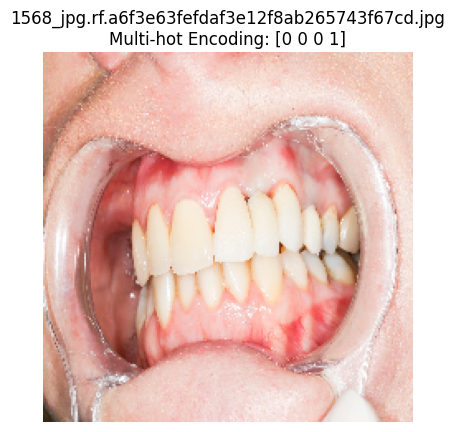

Image File Name: 39_jpg.rf.28fe3699ddd80e58a528d742fd14785f.jpg, Multi-hot Encoding: [1 1 0 1]


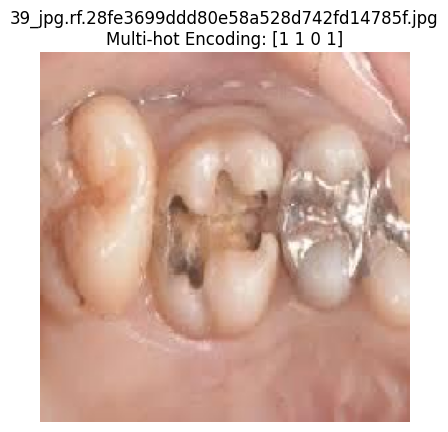

Image File Name: 765_jpg.rf.925a354e33d7da3bd14b1114e7b4ccf7.jpg, Multi-hot Encoding: [0 0 0 1]


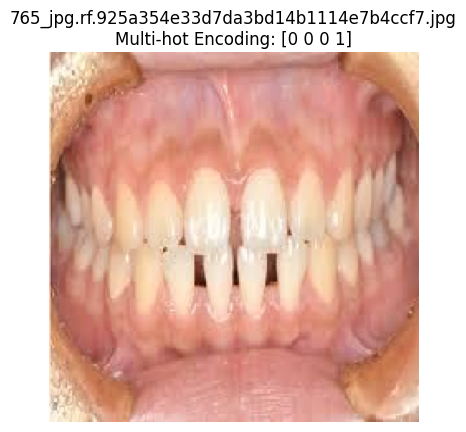

Image File Name: 940_jpg.rf.78693e399a3b4fd7be4a56d8fe003d70.jpg, Multi-hot Encoding: [0 0 0 1]


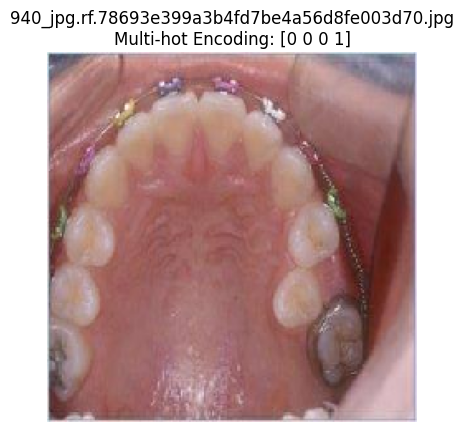

Image File Name: 3442_jpg.rf.a9391917f6a6ca14e2af2c51ad8d5517.jpg, Multi-hot Encoding: [0 0 0 1]


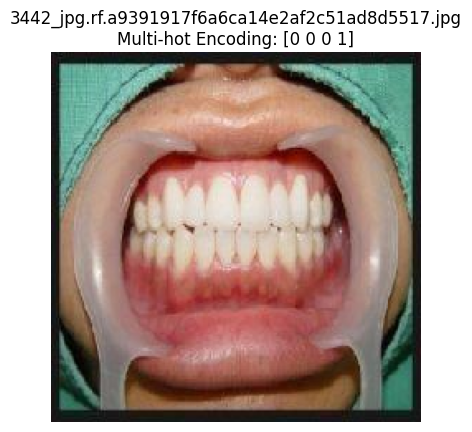

Image File Name: 407_jpg.rf.5f9869c4328e97385473ba05c7acc6c4.jpg, Multi-hot Encoding: [0 0 0 1]


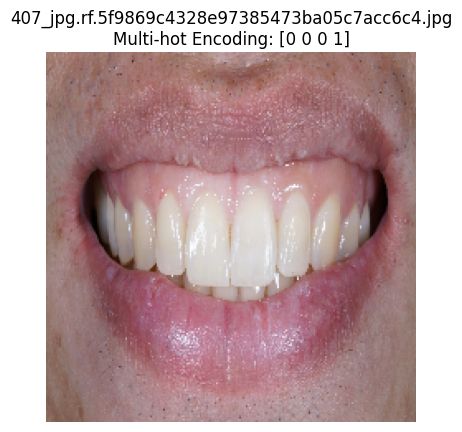

Image File Name: 1956_jpg.rf.6e5c3abb4e97610d86ec3fe3e68ed128.jpg, Multi-hot Encoding: [1 0 0 0]


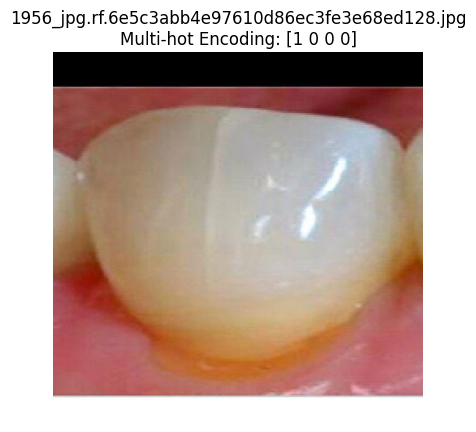

Image File Name: 120_jpg.rf.3db10027c7e08c24c81f109d59d4a9e8.jpg, Multi-hot Encoding: [0 0 0 1]


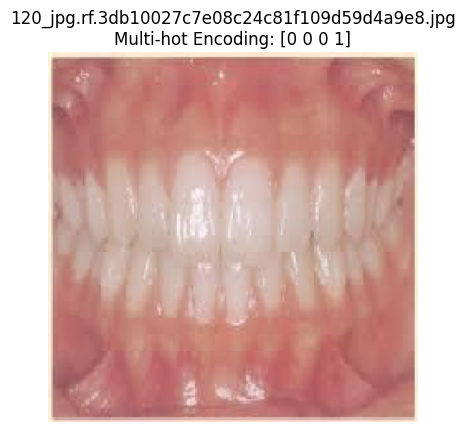

Image File Name: 2118_jpg.rf.d000b23b0dd62c53b526943f5ca2d3be.jpg, Multi-hot Encoding: [1 0 0 1]


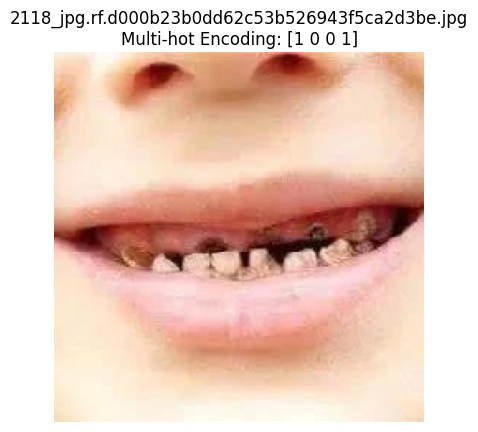

Image File Name: 344_jpg.rf.be3d2cd47d09e14abad6233906e7ea2b.jpg, Multi-hot Encoding: [1 1 0 1]


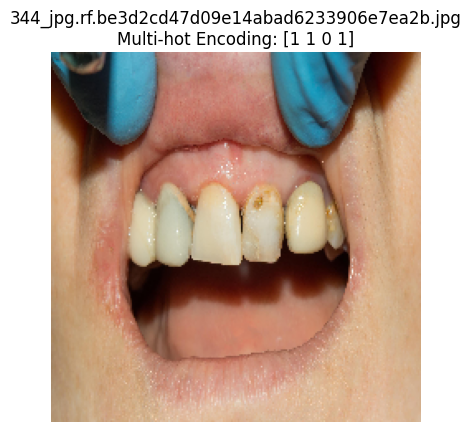

Image File Name: 409_jpg.rf.2f498ae67f763c73ae091a4ccb00a7a0.jpg, Multi-hot Encoding: [0 0 1 1]


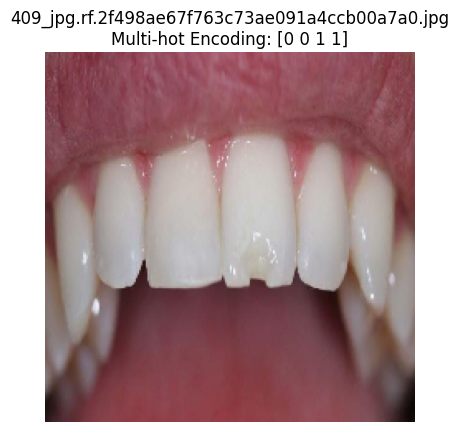

Image File Name: 2805_jpg.rf.892347a853748f053cc5e95f0f201b0b.jpg, Multi-hot Encoding: [0 1 0 1]


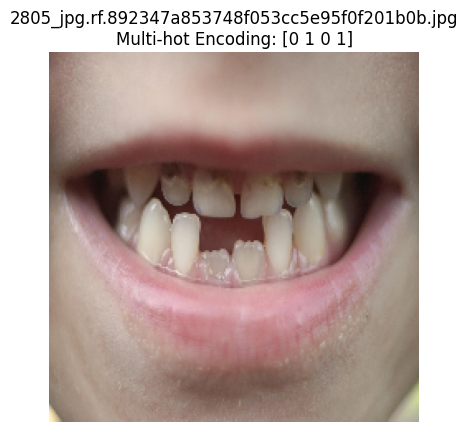

Image File Name: 1108_jpg.rf.78f094a05fbe5fd81eff90f25e61b1a9.jpg, Multi-hot Encoding: [0 0 0 1]


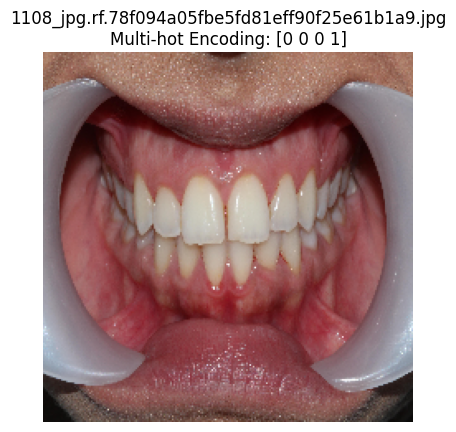

Image File Name: 1710_jpg.rf.43e43f1c40e3539e09bc2341c848dd24.jpg, Multi-hot Encoding: [1 1 0 1]


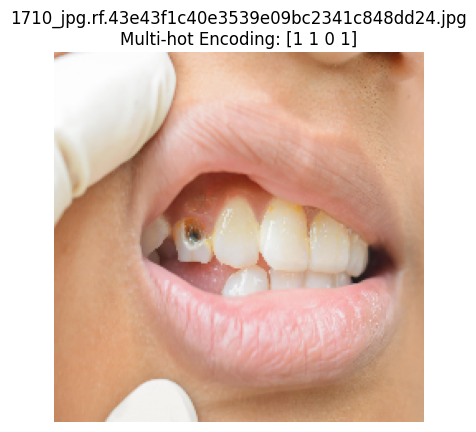

Image File Name: 491_jpg.rf.8edb10172502e52de8f570c3edc184b2.jpg, Multi-hot Encoding: [1 1 0 1]


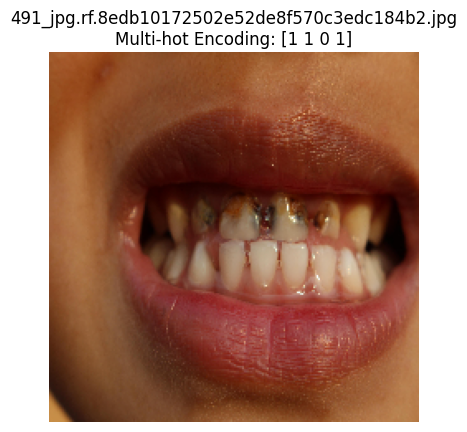

Image File Name: 2583_jpg.rf.ff65fefec699f7a888bd346b3fee4636.jpg, Multi-hot Encoding: [1 0 0 1]


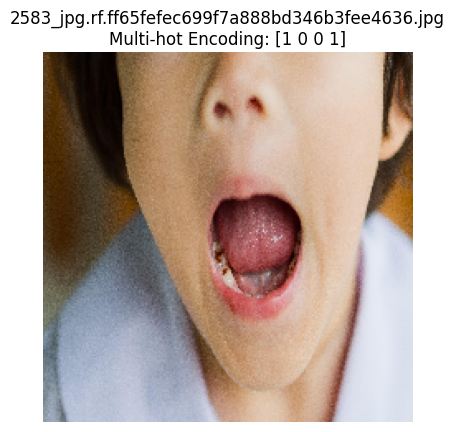

Image File Name: 2467_jpg.rf.e8ca36c80549ff964f4350bbff8ec099.jpg, Multi-hot Encoding: [0 0 0 1]


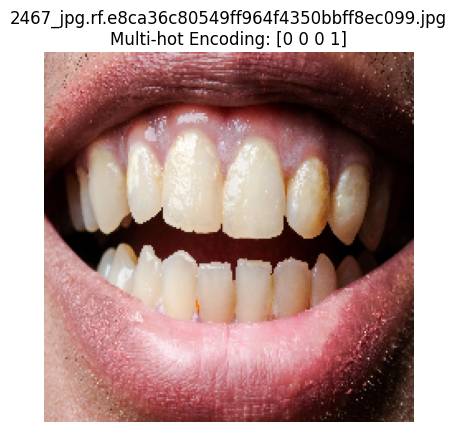

Image File Name: 1836_jpg.rf.3bd2c5836356b3dd7d5c02a37117ae14.jpg, Multi-hot Encoding: [0 0 0 1]


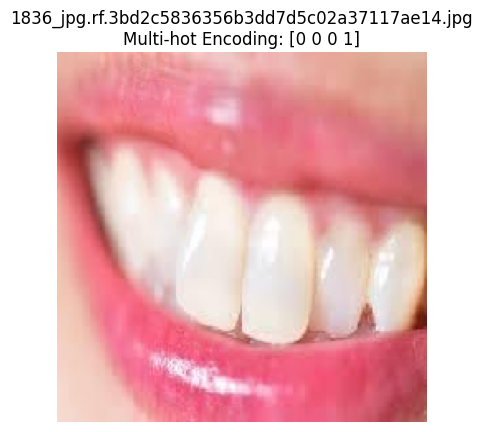

Image File Name: 390_jpg.rf.fe4652d342daa09659936cf1ad3b2169.jpg, Multi-hot Encoding: [1 1 0 1]


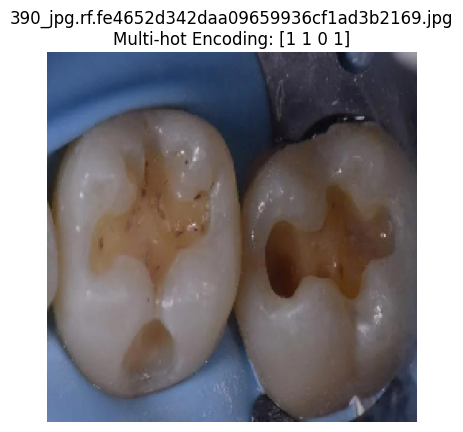

Image File Name: 336_jpg.rf.50413cadf82947340adcf7239c38995c.jpg, Multi-hot Encoding: [1 1 0 1]


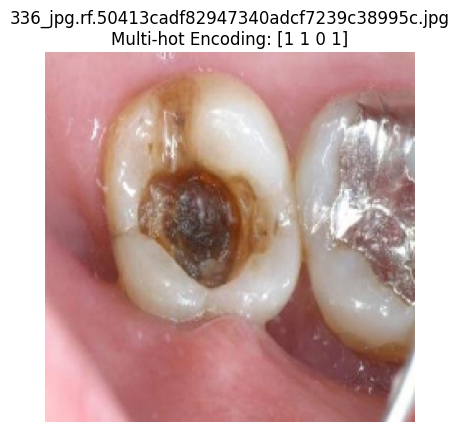

Image File Name: 660_jpg.rf.5f35800cd4a7d2c86d44b4c8d882a930.jpg, Multi-hot Encoding: [0 0 0 1]


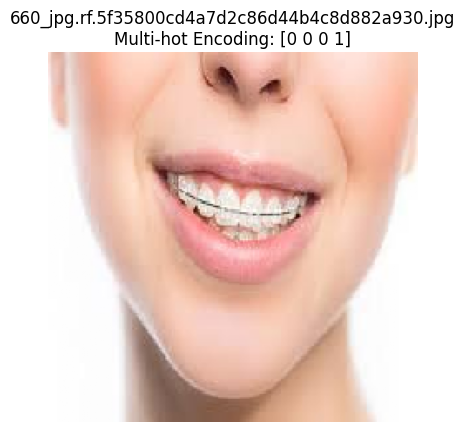

Image File Name: 9_jpg.rf.f6a5d595f26d3dab928304e6ab87cf96.jpg, Multi-hot Encoding: [1 1 0 1]


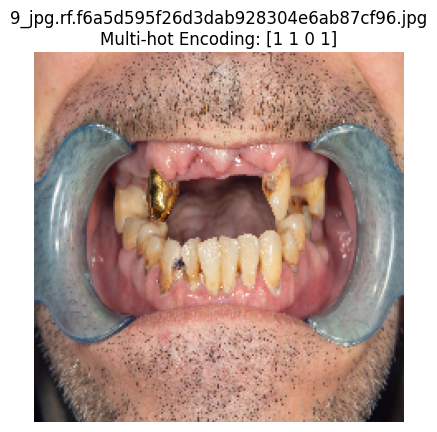

Image File Name: 3368_jpg.rf.dfd057e62081cf9afa1ac52d5d52cde9.jpg, Multi-hot Encoding: [0 1 0 1]


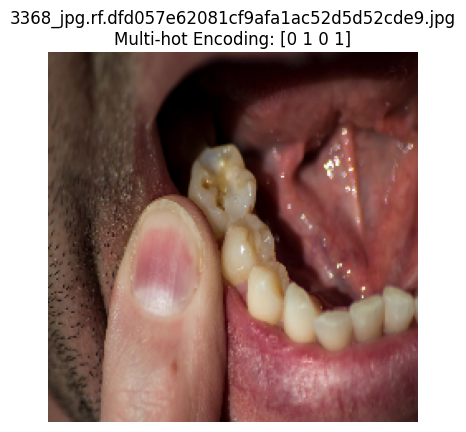

Image File Name: 532_jpg.rf.af74e6497f75be6036ca95605dee74aa.jpg, Multi-hot Encoding: [0 0 0 1]


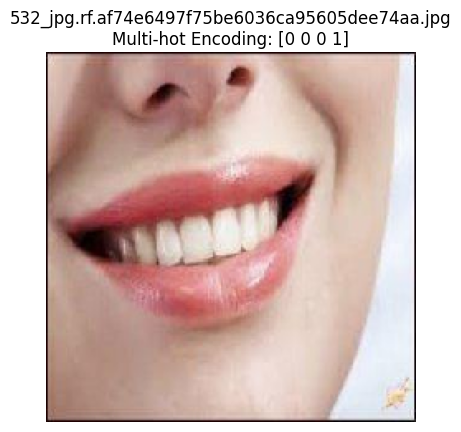

In [ ]:
import matplotlib.pyplot as plt
import os

# Assuming you have stored file paths and multi-hot labels
file_paths = [os.path.join(train_image_dir, f) for f in os.listdir(train_image_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
processed_images = all_image_paths['train']  # Preprocessed image data
multi_hot_labels = numerical_labels['train']  # Multi-hot encoded labels

# Loop to display the first 10 images with file names and multi-hot encodings
for i in range(min(35, len(file_paths))):  # Limit to 10 or the number of files, whichever is smaller
    # Extract file name from the file path
    image_file_name = os.path.basename(file_paths[i])

    # Get the corresponding multi-hot label
    multi_hot_label = multi_hot_labels[i]

    # Print file name and multi-hot encoding
    print(f"Image File Name: {image_file_name}, Multi-hot Encoding: {multi_hot_label}")

    # Display the preprocessed image
    plt.imshow(processed_images[i])  # Use the preprocessed image data
    plt.title(f"{image_file_name}\nMulti-hot Encoding: {multi_hot_label}")
    plt.axis("off")
    plt.show()

In [ ]:
import numpy as np

# Assuming 'numerical_labels' contains the multi-hot encoded labels for train, valid, and test sets
# Also, assume you have a list or dictionary of class names (e.g., ['Class_0', 'Class_1', ..., 'Class_n'])

class_names = ['Caries', 'Cavity', 'Crack', 'Tooth']  # Replace this with your actual class names

# Function to calculate the distribution of classes
def get_class_distribution(labels, class_names):
    # Sum the multi-hot encoded labels across all images (axis=0 gives the total occurrences for each class)
    class_distribution = labels.sum(axis=0)

    # Create a dictionary with class names and their counts
    return dict(zip(class_names, class_distribution))

# Assuming numerical_labels is a dictionary with train, valid, and test keys
train_labels = np.array(numerical_labels['train'])
valid_labels = np.array(numerical_labels['valid'])
test_labels = np.array(numerical_labels['test'])

# Get class distribution for all sets
train_dist = get_class_distribution(train_labels, class_names)
valid_dist = get_class_distribution(valid_labels, class_names)
test_dist = get_class_distribution(test_labels, class_names)

# Print the distributions
print(f"Train Class Distribution: {train_dist}")
print(f"Valid Class Distribution: {valid_dist}")
print(f"Test Class Distribution: {test_dist}")


Train Class Distribution: {'Caries': 964, 'Cavity': 817, 'Crack': 131, 'Tooth': 1989}
Valid Class Distribution: {'Caries': 102, 'Cavity': 85, 'Crack': 12, 'Tooth': 254}
Test Class Distribution: {'Caries': 124, 'Cavity': 97, 'Crack': 11, 'Tooth': 250}


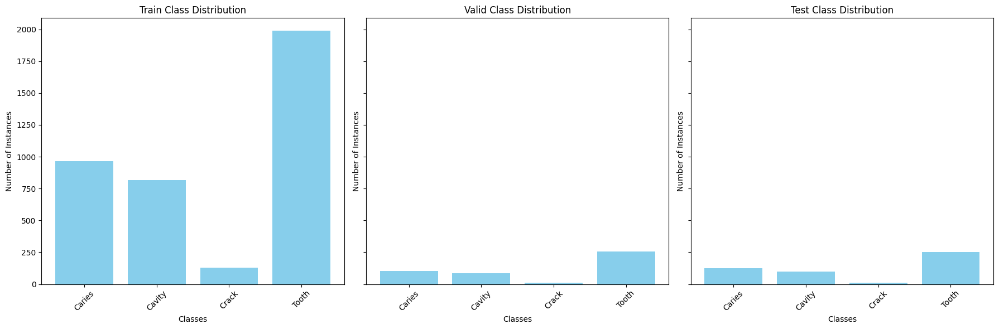

In [ ]:
import matplotlib.pyplot as plt

# Function to plot class distributions
def plot_class_distribution(ax, dist_dict, title, class_names):
    ax.bar(dist_dict.keys(), dist_dict.values(), tick_label=class_names, color='skyblue')
    ax.set_xlabel('Classes')
    ax.set_ylabel('Number of Instances')
    ax.set_title(title)
    ax.tick_params(axis='x', rotation=45)  # Rotate labels for better readability

# Class names as per your dataset
class_names = ['Caries', 'Cavity', 'Crack', 'Tooth']  # Replace with your actual class names

# Create a figure with 3 subplots in a single row
fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

# Plot each distribution
plot_class_distribution(axs[0], train_dist, "Train Class Distribution", class_names)
plot_class_distribution(axs[1], valid_dist, "Valid Class Distribution", class_names)
plot_class_distribution(axs[2], test_dist, "Test Class Distribution", class_names)

# Adjust layout
plt.tight_layout()
plt.show()



In [ ]:
import os
import json

def count_classes(data_dir):
    """
    Count the occurrences of each class in the annotation files within the given directory.

    Parameters:
    - data_dir: The path to the dataset directory (e.g., 'train', 'test', 'valid').

    Returns:
    - A dictionary with class names as keys and counts as values.
    """
    # Initialize a dictionary to store the count of unique images per class
    class_counts = { 'Cavity': 0, 'Caries': 0, 'Tooth': 0, 'Crack': 0 }

    # List the annotation files
    ann_dir = os.path.join(data_dir, 'ann')
    if not os.path.exists(ann_dir):
        print(f"Annotation directory not found: {ann_dir}")
        return class_counts

    annotation_files = os.listdir(ann_dir)

    # Iterate over annotation files
    for ann_file in annotation_files:
        # Load the annotation file
        with open(os.path.join(ann_dir, ann_file), 'r') as f:
            annotation = json.load(f)

        # Track unique image occurrence for each class
        for obj in annotation['objects']:
            class_label = obj['classTitle']
            if class_label in class_counts:
                class_counts[class_label] += 1

    return class_counts


# Directories for train, test, and valid
dataset_dir = '/content/drive/MyDrive/ML project/dental'
sets = ['train', 'test', 'valid']

# Count classes for each set
for dataset_set in sets:
    set_dir = os.path.join(dataset_dir, dataset_set)
    print(f"Processing set: {dataset_set}")
    counts = count_classes(set_dir)
    for class_name, count in counts.items():
        print(f"  Class '{class_name}' appears {count} times.")


Processing set: train
  Class 'Cavity' appears 1452 times.
  Class 'Caries' appears 3451 times.
  Class 'Tooth' appears 17884 times.
  Class 'Crack' appears 150 times.
Processing set: test
  Class 'Cavity' appears 170 times.
  Class 'Caries' appears 433 times.
  Class 'Tooth' appears 2194 times.
  Class 'Crack' appears 14 times.
Processing set: valid
  Class 'Cavity' appears 159 times.
  Class 'Caries' appears 328 times.
  Class 'Tooth' appears 2653 times.
  Class 'Crack' appears 16 times.


Processing set: train
  Class 'Cavity' appears 1452 times.
  Class 'Caries' appears 3451 times.
  Class 'Tooth' appears 17884 times.
  Class 'Crack' appears 150 times.


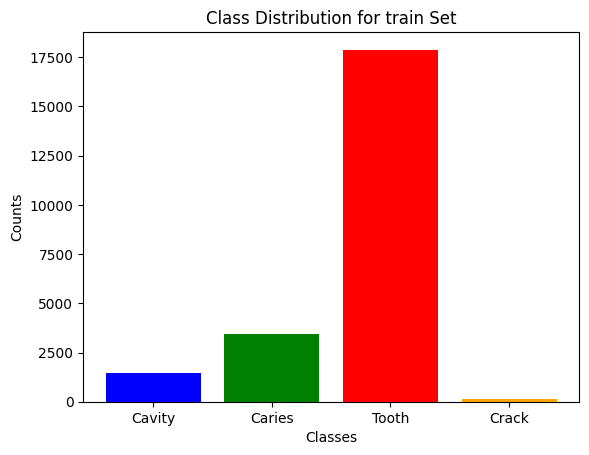

Processing set: test
  Class 'Cavity' appears 170 times.
  Class 'Caries' appears 433 times.
  Class 'Tooth' appears 2194 times.
  Class 'Crack' appears 14 times.


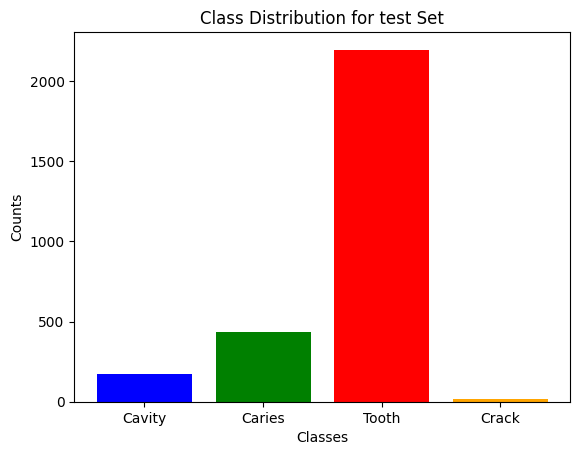

Processing set: valid
  Class 'Cavity' appears 159 times.
  Class 'Caries' appears 328 times.
  Class 'Tooth' appears 2653 times.
  Class 'Crack' appears 16 times.


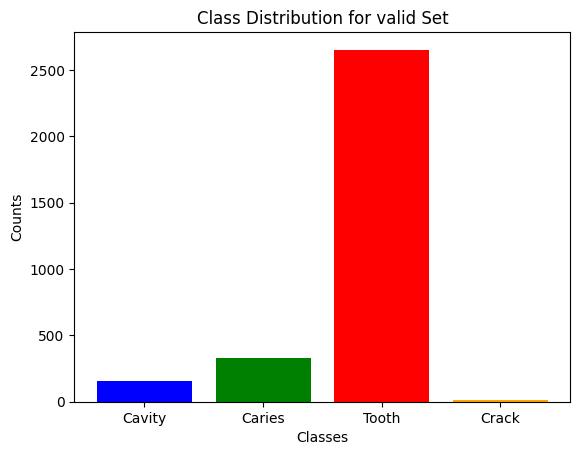

In [ ]:
import os
import json
import matplotlib.pyplot as plt

def count_classes(data_dir):
    """
    Count the occurrences of each class in the annotation files within the given directory.

    Parameters:
    - data_dir: The path to the dataset directory (e.g., 'train', 'test', 'valid').

    Returns:
    - A dictionary with class names as keys and counts as values.
    """
    # Initialize a dictionary to store the count of unique images per class
    class_counts = { 'Cavity': 0, 'Caries': 0, 'Tooth': 0, 'Crack': 0 }

    # List the annotation files
    ann_dir = os.path.join(data_dir, 'ann')
    if not os.path.exists(ann_dir):
        print(f"Annotation directory not found: {ann_dir}")
        return class_counts

    annotation_files = os.listdir(ann_dir)

    # Iterate over annotation files
    for ann_file in annotation_files:
        # Load the annotation file
        with open(os.path.join(ann_dir, ann_file), 'r') as f:
            annotation = json.load(f)

        # Track unique image occurrence for each class
        for obj in annotation['objects']:
            class_label = obj['classTitle']
            if class_label in class_counts:
                class_counts[class_label] += 1

    return class_counts

def plot_class_distribution(counts, dataset_set):
    """
    Plot the class distribution for the given dataset set.

    Parameters:
    - counts: A dictionary with class names as keys and counts as values.
    - dataset_set: The name of the dataset set (train, test, valid).
    """
    plt.bar(counts.keys(), counts.values(), color=['blue', 'green', 'red', 'orange'])
    plt.xlabel('Classes')
    plt.ylabel('Counts')
    plt.title(f'Class Distribution for {dataset_set} Set')
    plt.show()

# Directories for train, test, and valid
dataset_dir = '/content/drive/MyDrive/ML project/dental'
sets = ['train', 'test', 'valid']

# Count classes for each set and plot the graphs
for dataset_set in sets:
    set_dir = os.path.join(dataset_dir, dataset_set)
    print(f"Processing set: {dataset_set}")
    counts = count_classes(set_dir)
    for class_name, count in counts.items():
        print(f"  Class '{class_name}' appears {count} times.")

    plot_class_distribution(counts, dataset_set)  # Plot graph for the current dataset set


Processing set: train
  Class 'Cavity' appears 1452 times.
  Class 'Caries' appears 3451 times.
  Class 'Tooth' appears 17884 times.
  Class 'Crack' appears 150 times.


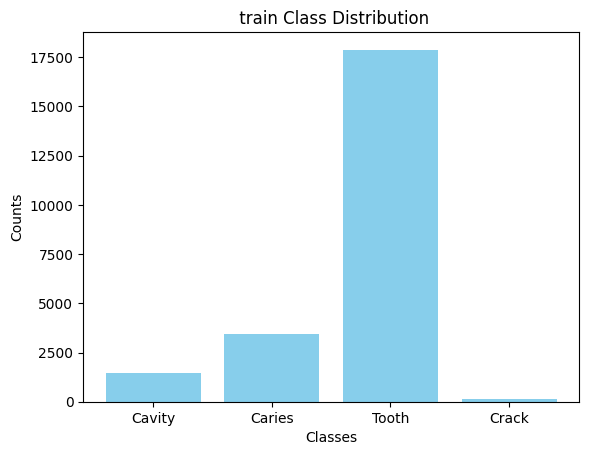

Processing set: test
  Class 'Cavity' appears 170 times.
  Class 'Caries' appears 433 times.
  Class 'Tooth' appears 2194 times.
  Class 'Crack' appears 14 times.


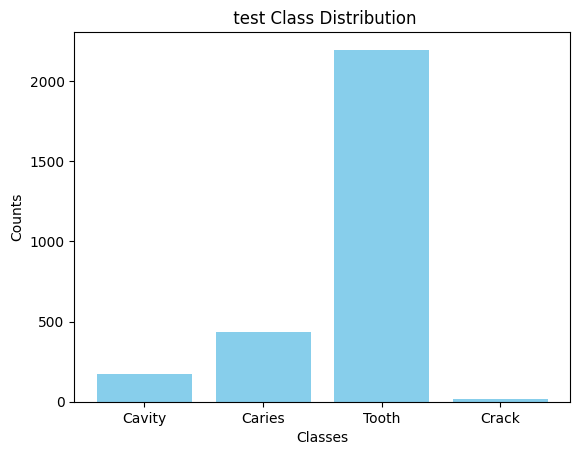

Processing set: valid
  Class 'Cavity' appears 159 times.
  Class 'Caries' appears 328 times.
  Class 'Tooth' appears 2653 times.
  Class 'Crack' appears 16 times.


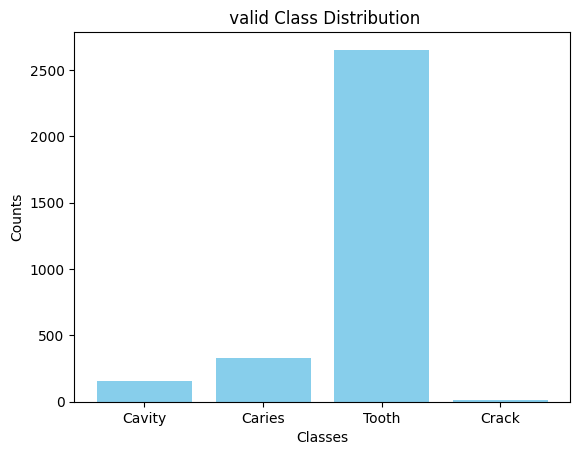

In [ ]:
import os
import json
import matplotlib.pyplot as plt

def count_classes(data_dir):
    """
    Count the occurrences of each class in the annotation files within the given directory.

    Parameters:
    - data_dir: The path to the dataset directory (e.g., 'train', 'test', 'valid').

    Returns:
    - A dictionary with class names as keys and counts as values.
    """
    # Initialize a dictionary to store the count of unique images per class
    class_counts = { 'Cavity': 0, 'Caries': 0, 'Tooth': 0, 'Crack': 0 }

    # List the annotation files
    ann_dir = os.path.join(data_dir, 'ann')
    if not os.path.exists(ann_dir):
        print(f"Annotation directory not found: {ann_dir}")
        return class_counts

    annotation_files = os.listdir(ann_dir)

    # Iterate over annotation files
    for ann_file in annotation_files:
        # Load the annotation file
        with open(os.path.join(ann_dir, ann_file), 'r') as f:
            annotation = json.load(f)

        # Track unique image occurrence for each class
        for obj in annotation['objects']:
            class_label = obj['classTitle']
            if class_label in class_counts:
                class_counts[class_label] += 1

    return class_counts

def plot_class_distribution(counts, dataset_set):
    """
    Plot the class distribution for the given dataset set.

    Parameters:
    - counts: A dictionary with class names as keys and counts as values.
    - dataset_set: The name of the dataset set (train, test, valid).
    """
    plt.bar(counts.keys(), counts.values(), color='skyblue')  # Use light sky blue color for the bars
    plt.xlabel('Classes')
    plt.ylabel('Counts')
    plt.title(f' {dataset_set} Class Distribution')
    plt.show()

# Directories for train, test, and valid
dataset_dir = '/content/drive/MyDrive/ML project/dental'
sets = ['train', 'test', 'valid']

# Count classes for each set and plot the graphs
for dataset_set in sets:
    set_dir = os.path.join(dataset_dir, dataset_set)
    print(f"Processing set: {dataset_set}")
    counts = count_classes(set_dir)
    for class_name, count in counts.items():
        print(f"  Class '{class_name}' appears {count} times.")

    plot_class_distribution(counts, dataset_set)  # Plot graph for the current dataset set
